# ANÁLISIS DE SENTIMIENTOS EN REDES SOCIALES

**Tarea Académica 2020** - David Fosca Gamarra

## #BlackLivesMatter en Twitter

**Resumen:** Este proyecto tiene como objetivo explorar las diversas caras que un movimiento de protesta social como "Black Lives Matter" puede tener en las redes sociales, especificamente en Twitter. Se busca conocer el nivel de complejidad que este movimiento puede tener en base a los diversos temas y emociones que los usuarios expresan utilizando el hashtag. A diferencia de un movimiento basado en violencia que se caracteriza por no generar críticas constructivas, se desea probar que este movimiento en las redes sociales es complejo y que sus miembros no solo predican con el odio (como por ejemplo los partidarios de las protestas violentas al rededor de Estados Unidos), si no que muestran su descontento, tristeza y esperanza por un cambio por el que luchan.

## Librerías

Importamos las librerías que utilizaremos a lo largo del notebook, desde la limpieza de textos hasta el análisis de sentimientos.

In [2]:
import time
import json
import re
import nltk
import spacy
import gensim
import string 
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import pyLDAvis.gensim
import GetOldTweets3 as got
import matplotlib.pyplot as plt
from gensim import corpora
from gensim import models
from bs4 import BeautifulSoup
from textblob import TextBlob
from autocorrect import Speller
from wordsegment import load, segment
from pymongo import MongoClient
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('words')
warnings.filterwarnings("ignore")
nlp = spacy.load("en_core_web_lg")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\David\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\David\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\David\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\David\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## 1. Lectura de Tweets almacenados en Base de Datos.

Se trabajará sobre una muestra de 1 mes (30 días) de datos, desde el **22 de Mayo hasta el 20 de Junio del 2020**. 
Para validar la hipótesis, utilizaremos el hashtag **#ACAB** ("All Cops Are Bastards"), que a simple vista parece que incita a la violencia, como referencia para compararlo con los resultados que obtengamos con el hashtag **#BlackLivesMatter**.

In [21]:
dates = ["2020-05-22","2020-05-23","2020-05-24","2020-05-25","2020-05-26","2020-05-27","2020-05-28","2020-05-29","2020-05-30",
        "2020-05-31","2020-06-01","2020-06-02","2020-06-03","2020-06-04","2020-06-05","2020-06-06","2020-06-07","2020-06-08",
        "2020-06-09","2020-06-10", "2020-06-11","2020-06-12","2020-06-13","2020-06-14","2020-06-15","2020-06-16","2020-06-17",
        "2020-06-18","2020-06-19","2020-06-20","2020-06-21"]

Para recolectar los datos de Twitter, se utilizó la librería **GetOldTweets3**, que permite obtener tweets de fechas diferentes al día de recolección. Asi mismo, para almacenar los tweets de ambos hashtags durante los días de recolección de datos se optó por utilizar el administrador de BD **MongoDB**.

In [4]:
print("Cantidad de Días Evaluados:", len(dates)-1)

Cantidad de Días Evaluados: 30


Se configuró la librería para recolectar un máximo de **10,000 tweets por día** para cada uno de los 30 días. Además, se recolectaron los tweets con el hashtag #BlackLivesMatter de dos maneras: i) Especificando a la librería que se desean obtener los tweets de mayor importancia o Top Tweets (más favoritos) y ii) No especificando esto y recolectando todos los tweets posibles entre esas fechas.

In [60]:
#Leemos el primer set de top tweets recolectado entre el 22/05 y el 21/06 sobre #BlackLivesMatter y almacenado en MongoDB:
myclient = MongoClient()
mydb = myclient["Hashtags"]
mycol = mydb["Final_BlackLiveMatters"]
x = mycol.count_documents({})
all_tweets_BLM_top = list(mycol.find({}))
print("La cantidad de top tweets registrados para #BlackLivesMatter entre el 22/05 y el 21/06 es:",x)

La cantidad de top tweets registrados para #BlackLivesMatter entre el 22/05 y el 21/06 es: 59475


In [61]:
#Leemos el segundo set de tweets recolectado entre el 22/05 y el 21/06 sobre #BlackLivesMatter y almacenado en MongoDB:
myclient = MongoClient()
mydb = myclient["Hashtags_all"]
mycol = mydb["Final_BLM"]
x = mycol.count_documents({})
all_tweets_BLM = list(mycol.find({}))
print("La cantidad de tweets registrados para #BlackLivesMatter entre el 22/05 y el 21/06 es:",x)

La cantidad de tweets registrados para #BlackLivesMatter entre el 22/05 y el 21/06 es: 202572


In [62]:
#Leemos el primer set de tweets recolectado entre el 22/05 y el 21/06 sobre #ACAB y almacenado en MongoDB:
myclient = MongoClient()
mydb = myclient["Hashtags_all"]
mycol = mydb["Final_ACAB"]
x = mycol.count_documents({})
all_tweets_ACAB = list(mycol.find({}))
print("La cantidad de tweets registrados para #ACAB entre el 22/05 y el 21/06 es:",x)

La cantidad de tweets registrados para #ACAB entre el 22/05 y el 21/06 es: 110631


In [9]:
#Creamos un dataset del primer set de tweets de #BlackLivesMatter:
tweets = []
for result in all_tweets_BLM_top:
    tweet_dict = {}
    tweet_dict['ID'] = str(result['ID'])
    tweet_dict['User'] = str(result['User'])
    tweet_dict['Text_Original'] = str(result['Text'])
    tweet_dict["Text_Original_Size"] = len(result['Text'])
    tweet_dict['Date'] = str(result['Date'])
    tweet_dict['Favorites'] = int(result['Favorites'])
    tweet_dict['Retweets'] = int(result['Retweets'])
    tweet_dict['Mentions'] = str(result['Mentions'])
    tweet_dict['Hashtags'] = str(result['Hashtags'])
    tweets.append(tweet_dict)
df_tweets_BLM_top = pd.DataFrame(tweets)
df_tweets_BLM_top.shape

(59475, 9)

In [10]:
#Creamos un dataset del segundo set de tweets de #BlackLivesMatter:
tweets = []
for result in all_tweets_BLM:
    tweet_dict = {}
    tweet_dict['ID'] = str(result['ID'])
    tweet_dict['User'] = str(result['User'])
    tweet_dict['Text_Original'] = str(result['Text'])
    tweet_dict["Text_Original_Size"] = len(result['Text'])
    tweet_dict['Date'] = str(result['Date'])
    tweet_dict['Favorites'] = int(result['Favorites'])
    tweet_dict['Retweets'] = int(result['Retweets'])
    tweet_dict['Mentions'] = str(result['Mentions'])
    tweet_dict['Hashtags'] = str(result['Hashtags'])
    tweets.append(tweet_dict)
df_tweets_BLM = pd.DataFrame(tweets)
df_tweets_BLM.shape

(202572, 9)

In [11]:
#Creamos un dataset para el set de tweets de #ACAB:
tweets = []
for result in all_tweets_ACAB:
    tweet_dict = {}
    tweet_dict['ID'] = str(result['ID'])
    tweet_dict['User'] = str(result['User'])
    tweet_dict['Text_Original'] = str(result['Text'])
    tweet_dict["Text_Original_Size"] = len(result['Text'])
    tweet_dict['Date'] = str(result['Date'])
    tweet_dict['Favorites'] = int(result['Favorites'])
    tweet_dict['Retweets'] = int(result['Retweets'])
    tweet_dict['Mentions'] = str(result['Mentions'])
    tweet_dict['Hashtags'] = str(result['Hashtags'])
    tweets.append(tweet_dict)
df_tweets_ACAB = pd.DataFrame(tweets)
df_tweets_ACAB.shape

(110631, 9)

In [12]:
#Unimos ambos datasets sobre #BlackLivesMatter:
df_BLM = df_tweets_BLM_top.append(df_tweets_BLM)
print("La cantidad total de tweets registrados sobre #BlackLivesMatter en 30 días es:", len(df_BLM.ID))

La cantidad de tweets registrados sobre #BlackLiveMatters en 30 días es: 262047


In [13]:
#Para el Dataset sobre #ACAB:
df_ACAB = df_tweets_ACAB
print("La cantidad de tweets registrados sobre #ACAB en 30 días es:", len(df_ACAB.ID))

La cantidad de tweets registrados sobre #ACAB en 30 días es: 110631


In [14]:
#Revisamos los datos del dataset final para #BlackLivesMatter:
df_BLM.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262047 entries, 0 to 202571
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   ID                  262047 non-null  object
 1   User                262047 non-null  object
 2   Text_Original       262047 non-null  object
 3   Text_Original_Size  262047 non-null  int64 
 4   Date                262047 non-null  object
 5   Favorites           262047 non-null  int64 
 6   Retweets            262047 non-null  int64 
 7   Mentions            262047 non-null  object
 8   Hashtags            262047 non-null  object
dtypes: int64(3), object(6)
memory usage: 20.0+ MB


In [15]:
#Revisamos los datos del dataset final para #ACAB:
df_ACAB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110631 entries, 0 to 110630
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   ID                  110631 non-null  object
 1   User                110631 non-null  object
 2   Text_Original       110631 non-null  object
 3   Text_Original_Size  110631 non-null  int64 
 4   Date                110631 non-null  object
 5   Favorites           110631 non-null  int64 
 6   Retweets            110631 non-null  int64 
 7   Mentions            110631 non-null  object
 8   Hashtags            110631 non-null  object
dtypes: int64(3), object(6)
memory usage: 7.6+ MB


# 2. Limpieza de Textos: #BlackLivesMatter

Se realizaron los siguientes pasos para la limpieza de texto de los tweets:
1. Eliminar tweets con **texto duplicado** de la base de datos.
2. Realizar **limpieza y tokenización** del texto a detalle.
3. Eliminar los tweets que tengan **menos de 20 caracteres** ya que no se consideran valiosos para el análisis.

In [64]:
#Calculamos la cantidad de tweets repetidos y eliminamos duplicados:
df_trial = df_BLM.copy() 
print("Porcentaje Tweets duplicados por texto para #BlackLivesMatter:", 100*(df_trial[df_trial.duplicated(subset ="Text_Original")].User.count())/df_trial.User.count())
df_trial.drop_duplicates(subset ="Text_Original", inplace = True)
df_trial.index = range(len(df_trial.Text_Original))
print("Tweets disponibles para #BlackLivesMatter:", df_trial.User.count())

Porcentaje Tweets duplicados por texto para #BlackLivesMatter: 5.886730243048003
Tweets disponibles para #BlackLivesMatter: 246621


Para la **limpieza y tokenización** del texto de cada tweet, se realizaron los siguientes pasos:
1. Reemplazamos direcciones de páginas web por espacio en blanco.
2. Reemplazar direcciones de imágenes en twitter por espacio en blanco.
3. Eliminamos palabras de menos de 3 caracteres.
4. Eliminamos hashtags.
5. Eliminamos menciones.
6. Eliminamos stopwords y caracteres numéricos.
7. Reemplazamos contracciones.
8. Reemplazamos signos de puntuación y caracteres especiales por espacio en blanco.
9. Generamos tokens y los convertimos a letras minúsculas.
10. Aplicamos Lematización.
11. Aplicamos Streaming.

In [67]:
#Implementamos la función de limpieza y tokenización de datos:
def Limpieza_Tokenizacion(text, lang, hashtags, mentions):
    text = text.replace("&amp", " ")
    st = stopwords.words(lang)
    stemmer = SnowballStemmer(lang)
    #Reemplazamos direcciones de páginas web por espacio en blanco:
    text = re.sub(r"http\S+", " ", text)
    #Reemplazamos direcciones de imágenes en twitter por espacio en blanco:
    text = re.sub(r"pic.twitter.com\S+", " ", text)
    #Eliminamos Hashgtags por que generan mucho ruido al tokenizar los datos:
    hashtag = [tag for tag in hashtags.split() if tag.startswith("#")]
    hashtag.sort(key = len)
    hashtag = hashtag[::-1]
    for j in range(0,len(hashtag)):
        text = text.replace(str(hashtag[j])," ")
    text = text.strip()
    #Eliminamos Menciones por que generan mucho ruido al tokenizar los datos:
    mention = [teg for teg in mentions.split() if teg.startswith("@")]
    mention.sort(key = len)
    mention = mention[::-1]
    for j in range(0,len(mention)):
        text = text.replace(str(mention[j])," ")
    text = text.strip()
    #Eliminamos caracteres no alfabéticos:
    text = re.sub(r"[^a-zA-Z]|(\w+:\/\/\S+)"," ", text).split()  
    #Eliminamos plabras de ménos de 3 caracteres:
    text = [w for w in text if len(w)>2]
    text = " ".join(text)
    #Reemplazamos algunas contracciones:
    contractions = {"mayn't":"may not","'em":"them", "may've":"may have","MF":"mother fucker","may've":"may have","popo":"police","ain't":"am not", "didn't ":"did not",
                   "can't":"can not"}
    text = text.replace("’","'")
    words = text.split()
    mod = [contractions[word] if word in contractions else word for word in words]
    text_clean = " ".join(mod)
    #Reemplazamos signos de puntuación y caracteres especiales por espacio en blanco:
    text = re.sub(r"[^\w\s]"," ",text_clean)
    #Generamos tokens:
    wordnet_lemmatizer = WordNetLemmatizer()
    #Convertimos tokens a letras minúsculas:
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    filtered_tokens_stem = []
    for token in tokens:
        #Eliminar stopwords y caracteres numéricos:
        if re.search('[a-zA-Z]', token) and (token not in st):
            token = wordnet_lemmatizer.lemmatize(token)
            token_stem = stemmer.stem(token)
            filtered_tokens.append(token)
            filtered_tokens_stem.append(token_stem)
    
    return text_clean, filtered_tokens, filtered_tokens_stem

In [68]:
#Realizamos la tokenización y limpieza de los datos:
clean_data = 0
tokens = [] 
tokens_stem = []
df_trial['Clean_Data'] = 0
df_trial['Clean_Data_Size'] = 0
df_trial['Tokens'] = "0"
df_trial['Tokens_Stem'] = "0"
for i in range(0,len(df_trial.Text_Original)):
    clean_data, tokens, tokens_stem = Limpieza_Tokenizacion(df_trial.Text_Original[i], 'english', df_trial.Hashtags[i], df_trial.Mentions[i])
    df_trial['Clean_Data'][i] = clean_data
    df_trial['Clean_Data_Size'][i] = len(clean_data)
    df_trial['Tokens'][i] = tokens
    df_trial['Tokens_Stem'][i] = tokens_stem

In [22]:
#Verificamos la limpieza de los datos y los tokens generados:
i = 10212
clean_data, tokens, tokens_stem = Limpieza_Tokenizacion(df_trial.Text_Original[i], 'english', df_trial.Hashtags[i], df_trial.Mentions[i])
print(df_trial.Text_Original[i])
print("-")
print(clean_data)
print("-")
print(tokens)
print("-")
print(tokens_stem)

Her name is Belly Mujinga. She was spat at whilst at work by a man who claimed to have Covid-19. She was forced to work even after the incident. She deserves better than this. #BlackLivesMatter https://twitter.com/SkyNewsBreak/status/1266374092279541767
-
Her name Belly Mujinga She was spat whilst work man who claimed have Covid She was forced work even after the incident She deserves better than this
-
['name', 'belly', 'mujinga', 'spat', 'whilst', 'work', 'man', 'claimed', 'covid', 'forced', 'work', 'even', 'incident', 'deserves', 'better']
-
['name', 'belli', 'mujinga', 'spat', 'whilst', 'work', 'man', 'claim', 'covid', 'forc', 'work', 'even', 'incid', 'deserv', 'better']


In [209]:
#Obtenemos el tamaño del diccionario de tokens:
tokens = []
for i in range(len(df_trial.Text_Original)):
    tokens.extend(df_trial.Tokens[i])
unique_tokens = set(tokens)
unique_tokens_BLM = (list(unique_tokens))
print("Volumen de tokens para #BlackLivesMatter:", len(unique_tokens_BLM))

Volumen de tokens para #BlackLivesMatter: 59780


In [24]:
df_trial.head()

,ID,User,Text_Original,Text_Original_Size,Date,Favorites,Retweets,Mentions,Hashtags,Clean_Data,Clean_Data_Size,Tokens,Tokens_Stem
0,1263972587396358146,KaileeScales,Clearly we need Black representation on the to...,128,2020-05-22 23:18:42+00:00,210,43,@JoeBiden,#BlackLivesMatter #BlackLivesMatter #whatmatte...,Clearly need Black representation the top tick...,70,"[clearly, need, black, representation, top, ti...","[clear, need, black, represent, top, ticket, b..."
1,1263962674406264837,BuddyWinston,"Trump's website is now selling ""You Ain't Blac...",238,2020-05-22 22:39:19+00:00,51,19,,#Biden2020 #BlackLivesMatter #BlackLivesMatter...,Trump website now selling You Ain Black Joe Bi...,117,"[trump, website, selling, black, joe, biden, s...","[trump, websit, sell, black, joe, biden, shirt..."
2,1263939630476390400,PlatypiPolitics,Australian media- Will tell you about a white ...,212,2020-05-22 21:07:45+00:00,40,3,,#BlackLivesMatter #BlackLivesMatter,Australian media Will tell you about white Aus...,167,"[australian, medium, tell, white, australian, ...","[australian, medium, tell, white, australian, ..."
3,1263915392122130435,Blklivesmatter,We are not waiting on others...we holding a me...,242,2020-05-22 19:31:26+00:00,123,41,,#WhatMatters #BlackLivesMatter #BlackLivesMatt...,are not waiting others holding megaphone OUR i...,135,"[waiting, others, holding, megaphone, issue, a...","[wait, other, hold, megaphon, issu, affect, co..."
4,1263908853441232896,vashtij_,Kenneth Walker is a hero!!! A black man protec...,115,2020-05-22 19:05:27+00:00,38,12,,#breonataylor #BlackLivesMatter #BlackLivesMatter,Kenneth Walker hero black man protecting black...,62,"[kenneth, walker, hero, black, man, protecting...","[kenneth, walker, hero, black, man, protect, b..."


In [25]:
#Calculamos la cantidad de tweets (con texto limpio) que no tienen información útil (tamaño menor a 20 caracteres) y los eliminamos:
df_filter_trial = df_trial[df_trial['Clean_Data_Size'] >= 20]
df_filter_trial.index = range(len(df_filter_trial.Clean_Data_Size))
print("Porcentaje de Tweets NO útiles para #BlackLivesMatter:", 100*((df_trial.Clean_Data_Size.count()-df_filter_trial.Clean_Data_Size.count())/df_trial.Clean_Data_Size.count()))
print("Tweets Disponibles para #BlackLivesMatter:", df_filter_trial.Clean_Data_Size.count())

Porcentaje de Tweets NO útiles: 8.89826900385612
Tweets Disponibles: 224676


# 3. Análisis Exploratorio: #BlackLivesMatter

Se realizó el análisis de los tweets por cada uno de los días evaluados, considerando lo siguiente:
1. Hashtags más frecuentes.
2. Menciones más frecuentes.
3. Promedio de caracteres.
4. Volumen de retweets.
5. Volumen de tweets favoritos.
6. Volumen de tweets NO útiles vs tweets útiles.
7. Usuario con más retweets.
8. Usuario con más tweets favoritos.
9. Tamaño de texto promedio.

In [26]:
tweets_analysis = []
n_favorites_date, n_retweets_date, n_tweets_date = [], [], []
hashtag_date, mention_date, retweet_date, favorite_date = [], [], [], []

for i in range(0,len(dates)):
    tweets_analysis_dict = {}
    num_tweets = 1
    num_favorites, num_retweets, text_size, num_tweets_useful = 0, 0, 0, 0
    hashtag_date, mention_date, retweet_date, favorite_date = [], [], [], []
    mayor_retweet, mayor_favorite = 0, 0
    date = dates[i]
    for j in range(len(df_trial['User'])):
        date_twitter = df_trial['Date'][j]
        date_twitter = date_twitter[:10].strip()
        if date_twitter == date:
            num_tweets = num_tweets + 1
            text_size = text_size + df_trial["Clean_Data_Size"][j]
            num_favorites = num_favorites + df_trial["Favorites"][j]
            num_retweets = num_retweets + df_trial["Retweets"][j]
            if (df_trial['Clean_Data_Size'][j] >= 20):
                num_tweets_useful = num_tweets_useful + 1  
            if (df_trial["Retweets"][j] > mayor_retweet):
                mayor_retweet = df_trial["Retweets"][j]
                retweet_date = df_trial["User"][j]
            if (df_trial["Favorites"][j] > mayor_favorite):
                mayor_favorite = df_trial["Favorites"][j]
                favorite_date = df_trial["User"][j]
            hashtags = [tag for tag in df_trial.Hashtags[j].split() if tag.startswith("#")]
            hashtags = list(dict.fromkeys(hashtags))
            mentions = [tag for tag in df_trial.Mentions[j].split() if tag.startswith("@")]
            mentions = list(dict.fromkeys(mentions))
            hashtag_date.extend(hashtags)
            mention_date.extend(mentions)
                
    hashtag_counter = {}
    for hashtag in hashtag_date:
        if hashtag in hashtag_counter:
            hashtag_counter[hashtag] += 1
        else:
            hashtag_counter[hashtag] = 1
    popular_hashtags = sorted(hashtag_counter, key = hashtag_counter.get, reverse = True)

    mention_counter = {}
    for mention in mention_date:
        if mention in mention_counter:
            mention_counter[mention] += 1
        else:
            mention_counter[mention] = 1
    popular_mention = sorted(mention_counter, key = mention_counter.get, reverse = True)
    
    tweets_analysis_dict['Date'] = dates[i]
    tweets_analysis_dict['Average_Text_Size'] = int(text_size/num_tweets)
    tweets_analysis_dict['Volume_Retweet'] = num_retweets
    tweets_analysis_dict['Volume_Favorites'] = num_favorites
    tweets_analysis_dict['Users_Most_Retweet'] = retweet_date
    tweets_analysis_dict['Users_Most_Favorites'] = favorite_date
    tweets_analysis_dict['Volume_Tweets_Useful'] = num_tweets_useful
    tweets_analysis_dict['Volume_Tweets_Not_Useful'] = num_tweets - num_tweets_useful
    tweets_analysis_dict['Frequent_Hashtags'] = popular_hashtags[:8]
    tweets_analysis_dict['Frequent_Mentions'] = popular_mention[:8]
    tweets_analysis.append(tweets_analysis_dict)
    
df_summary = pd.DataFrame(tweets_analysis)
df_summary.shape

(31, 10)

In [27]:
df_summary.head()

,Date,Average_Text_Size,Volume_Retweet,Volume_Favorites,Users_Most_Retweet,Users_Most_Favorites,Volume_Tweets_Useful,Volume_Tweets_Not_Useful,Frequent_Hashtags,Frequent_Mentions
0,2020-05-22,94,1190,3709,lexcoupe96,thxitsthetrauma,711,63,"[#BlackLivesMatter, #BlackTwitter, #blacklives...","[@JoeBiden, @realDonaldTrump, @DNC, @GOP, @CNN..."
1,2020-05-23,95,833,1756,ZinnEdProject,ZinnEdProject,511,55,"[#BlackLivesMatter, #BlackTwitter, #blacklives...","[@JoeBiden, @realDonaldTrump, @Official1SP, @t..."
2,2020-05-24,95,1479,3096,BuddyWinston,BuddyWinston,421,60,"[#BlackLivesMatter, #blacklivesmatter, #BlackT...","[@JoeBiden, @DNC, @BarackObama, @realDonaldTru..."
3,2020-05-25,106,2038,10735,AmieMFbrown,AmieMFbrown,569,53,"[#BlackLivesMatter, #blacklivesmatter, #blackh...","[@BarackObama, @realDonaldTrump, @JoeBiden, @D..."
4,2020-05-26,101,278515,760690,flywithkamala,flywithkamala,8892,920,"[#BlackLivesMatter, #GeorgeFloyd, #blacklivesm...","[@MinneapolisPD, @realDonaldTrump, @MayorFrey,..."


Se obtuvieron los hashtags y menciones más frecuentes en el dataset para ver qué otros temas acompañaban el hashtag principal. En la presentación (PPT) se muestra algunos de los hashtags más importantes y sus significados.

In [24]:
#Obtenemos los hashtags más frecuentes de todos los días evaluados:
hashtags =Se realizaron los siguientes pasos para la limpieza de texto de los tweets:
1. Eliminar tweets con **texto duplicado** de la base de datos.
2. Realizar **limpieza y tokenización** del texto a detalle.
3. Eliminar los tweets que tengan **menos de 20 caracteres** ya que no se consideran valiosos para el análisis. []
for i in range(len(df_summary.Frequent_Hashtags)):
    hashtags.extend(df_summary.Frequent_Hashtags[i])
unique_hashtags = set(hashtags) 
unique_hashtags = (list(unique_hashtags))
print("Hashtags más comunes de los 30 días evaluados:", unique_hashtags)

Hashtags más comunes de los 30 días evaluados: ['#BLM', '#blacklivesmatter', '#RayshardBrooks', '#BlackTwitter', '#BLACKLIVESMATTER', '#coronagates', '#GeorgeFloydWasMurdered', '#Blacklivesmatter', '#RIPGeorgeFloyd', '#GeorgeFloydProtests', '#Biden2020', '#protest', '#JusticeForGeorgeFloyd', '#JusticeForFloyd', '#JusticeForGeorgeFlyod', '#BlackLivesMattters', '#NASCAR', '#Juneteenth', '#JusticeForGeorge', '#AllBlackLivesMatter', '#RIPTacoBell', '#AntifaTerrorists', '#icantbreathe', '#AmyCooper', '#IRunWithMaud', '#NXTTakeOver', '#racism', '#BlackLivesMater', '#JusticeforRobertFuller', '#BlueLivesMatter', '#MatchTheMillion', '#COVID19', '#TheSoCalledRaceCard', '#blacklifematters', '#BlackLivesMatters', '#nojusticenopeace', '#blackholocaust', '#ACAB', '#JoeBidenIsARacist', '#BlackOutTuesday', '#AhmaudArbery', '#JUNETEENTH2020', '#BLACK_LIVES_MATTER', '#StarTrekUnitedGives', '#BoycottStarbucks', '#MatchAMillion', '#coronavirus', '#minneapolisriots', '#MemorialDay2020', '#BlackLivesMatter'

In [25]:
#Obtenemos las menciones más frecuentes de todos los días evaluados:
mentions = []
for i in range(len(df_summary.Frequent_Mentions)):
    mentions.extend(df_summary.Frequent_Mentions[i])
unique_mentions = set(mentions) 
unique_mentions = (list(unique_mentions))
print("Hashtags más comunes de los 30 días evaluados:", unique_mentions)

Hashtags más comunes de los 30 días evaluados: ['@i_DJTweXz', '@realDonaldTrump', '@ArianaGrande', '@Airbnb', '@KadirNelson', '@ErinCondren', '@SenatorRomney', '@guardianeco', '@TrumpStudents', '@AFLCIO', '@amnesty', '@halsey', '@ArtValley818', '@JohnBoyega', '@nflcommish', '@BLMLA', '@abc7newsbayarea', '@dbongino', '@YorkshireTea', '@MNFreedomFund', '@JoeBiden', '@tiktok_us', '@Janefonda', '@HouseJudiciary', '@DDoSecrets', '@RandPaul', '@GovofCO', '@NASCAR', '@DickDurbin', '@BritishVogue', '@CNN', '@BorisJohnson', '@BarackObama', '@drewbrees', '@KeithHabs', '@splcenter', '@amazon', '@chicagosmayor', '@FOX29philly', '@KwameRaoul', '@shaunking', '@NFL', '@USCSysBio_Lab', '@EBONYMag', '@albertmohler', '@Twitter', '@xtina', '@TuckerCarlson', '@premierleague', '@sanbenito', '@YourAnonNews', '@DNC', '@MSNBC', '@cthagod', '@KingJames', '@ABC7Shack', '@PGtips', '@netflix', '@YourAnonCentral', '@GovAndyBeshear', '@BTS_twt', '@Official1SP', '@Kaepernick7', '@Galaxy_Cuup', '@MinneapolisPD', '@NA

Se generó una nube de palabras por cada uno de los días evaluados para analizar qué palabras son las más frecuentes y si se relacionan al contexto temporal. En la presentación (PPT) se muestra la línea de tiempo que se genera con estos gráficos.

Fecha: 2020-05-22


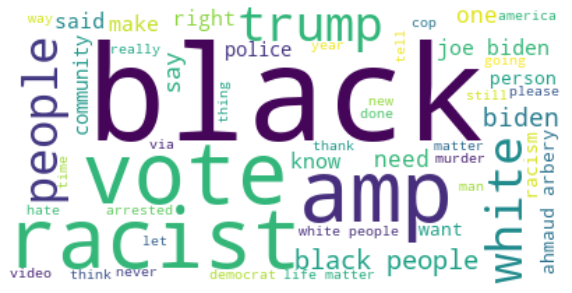

Fecha: 2020-05-23


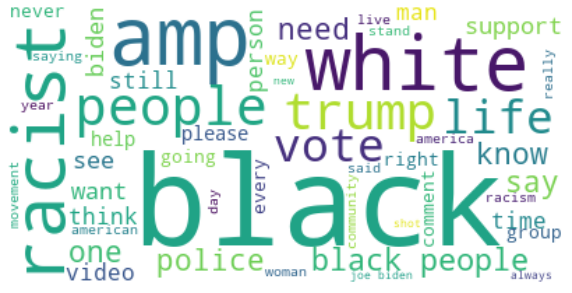

Fecha: 2020-05-24


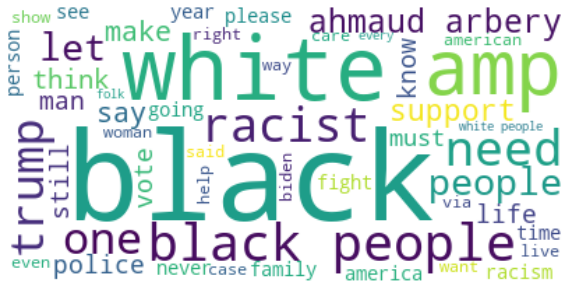

Fecha: 2020-05-25


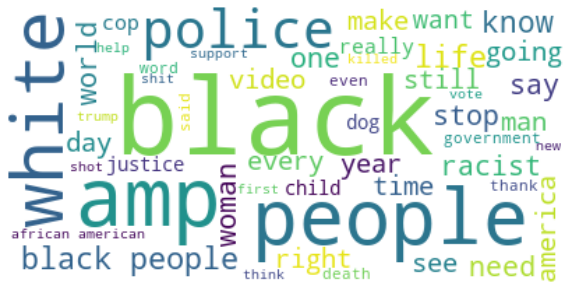

Fecha: 2020-05-26


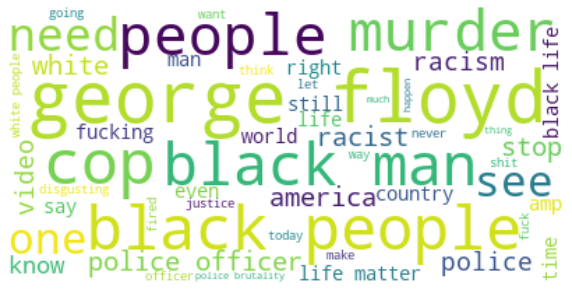

Fecha: 2020-05-27


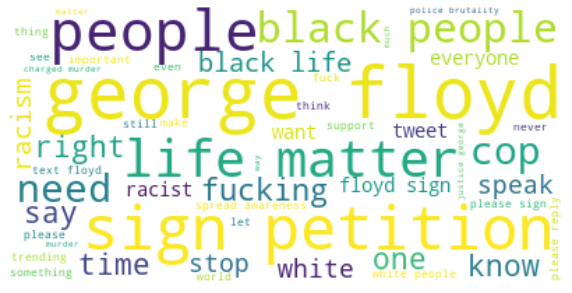

Fecha: 2020-05-28


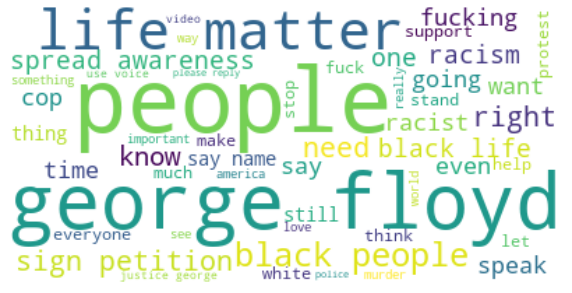

Fecha: 2020-05-29


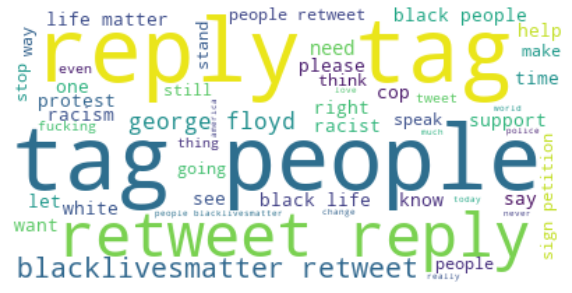

Fecha: 2020-05-30


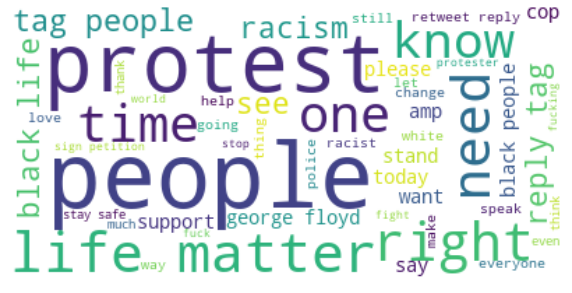

Fecha: 2020-05-31


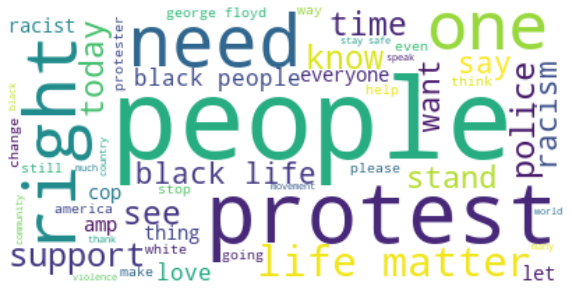

Fecha: 2020-06-01


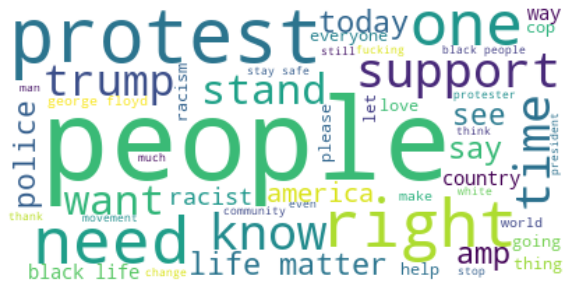

Fecha: 2020-06-02


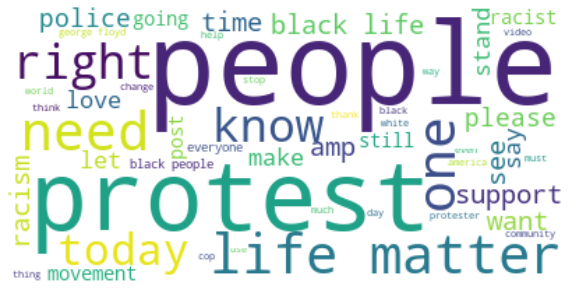

Fecha: 2020-06-03


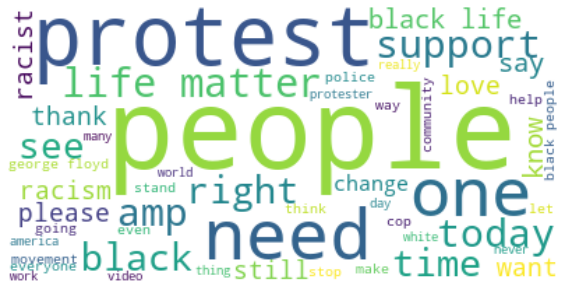

Fecha: 2020-06-04


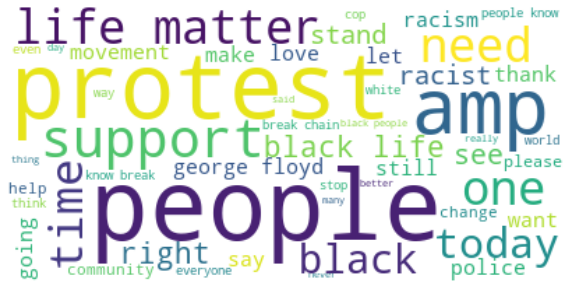

Fecha: 2020-06-05


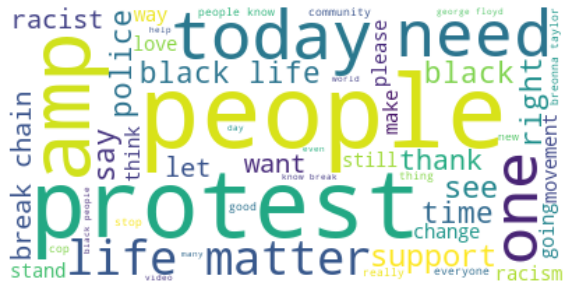

Fecha: 2020-06-06


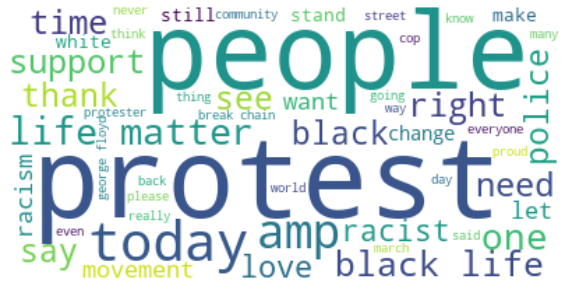

Fecha: 2020-06-07


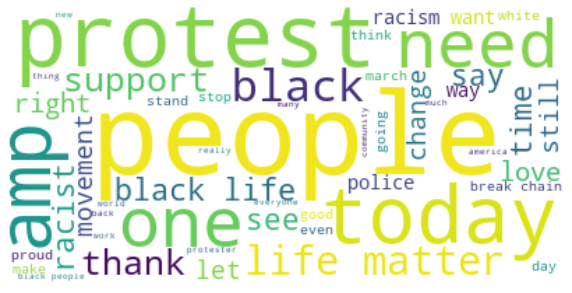

Fecha: 2020-06-08


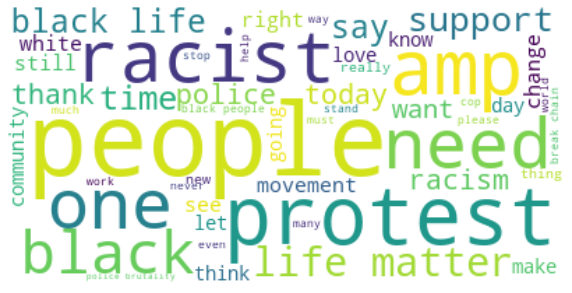

Fecha: 2020-06-09


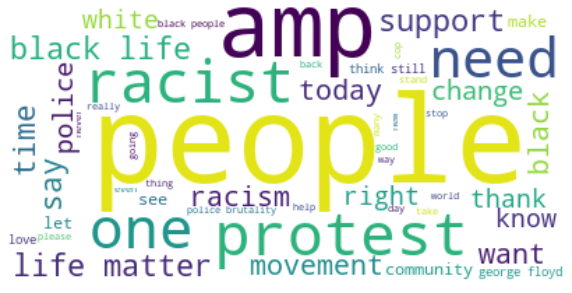

Fecha: 2020-06-10


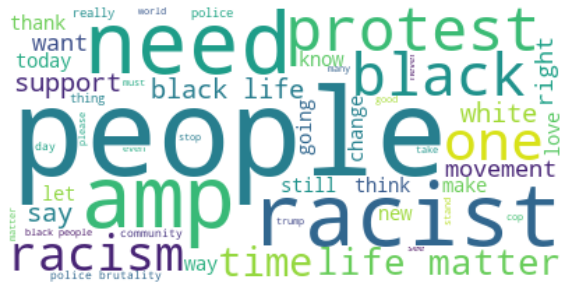

Fecha: 2020-06-11


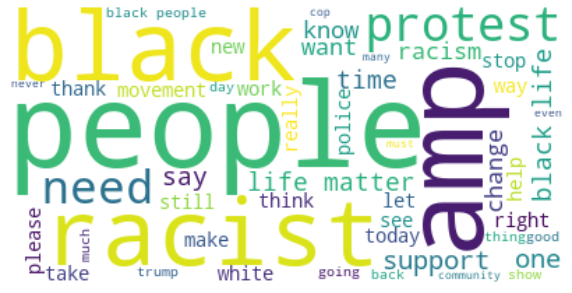

Fecha: 2020-06-12


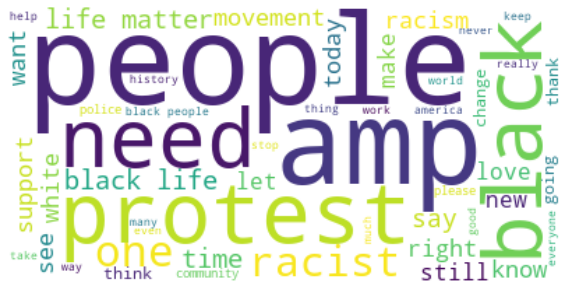

Fecha: 2020-06-13


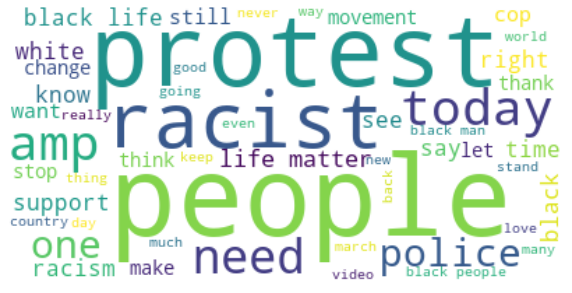

Fecha: 2020-06-14


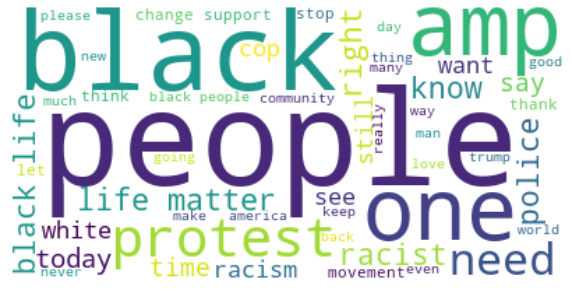

Fecha: 2020-06-15


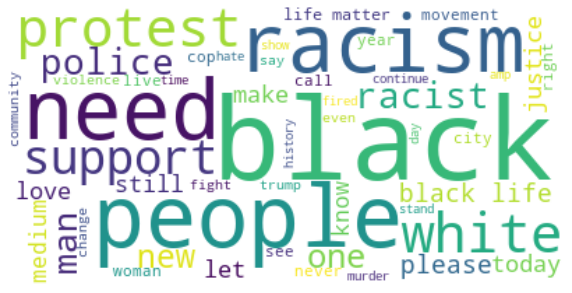

Fecha: 2020-06-16


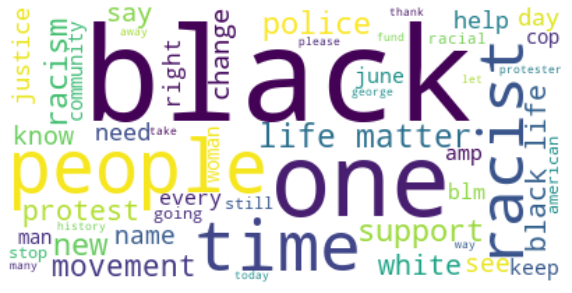

Fecha: 2020-06-17


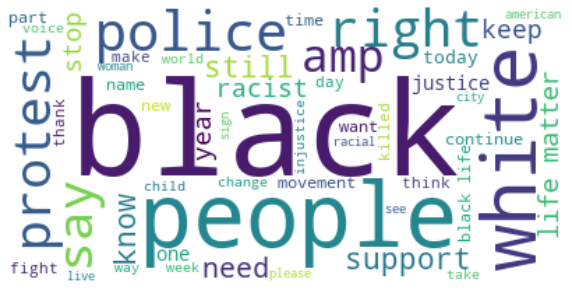

Fecha: 2020-06-18


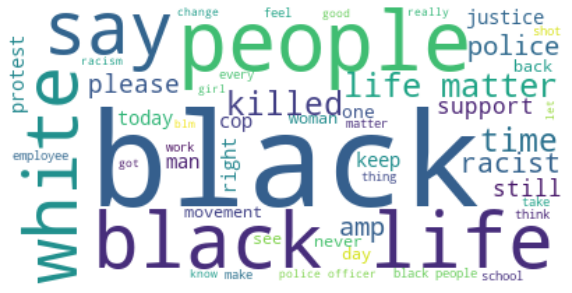

Fecha: 2020-06-19


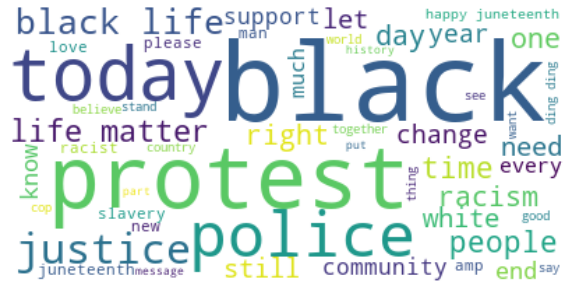

Fecha: 2020-06-20


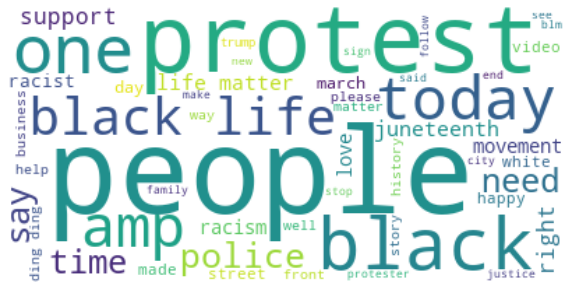

Fecha: 2020-06-21


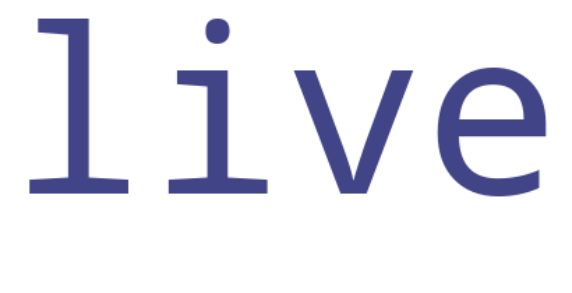

In [28]:
#Generamos una nube de palabras para cada uno de los días evaluados, utilizamos los tokens que han sido procesados:
foSe obtuvieron los hashtags y menciones más frecuentes en el dataset para ver qué otros temas acompañaban el hashtag principal.r i in range(0,len(dates)):
    date = dates[i]
    content = ["live"]
    for j in range(len(df_filter_trial["User"])):
        date_twitter = df_filter_trial["Date"][j]
        date_twitter = date_twitter[:10].strip()
        if date_twitter == date:
            content.extend(df_filter_trial["Tokens"][j])
    wordcloud = WordCloud(max_words=50,background_color="white").generate(' '.join(content))
    print("Fecha:",date)
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## Gráficos

1. Se muestra el gráfico de los tweets útiles vs los eliminados en pasos anteriores.

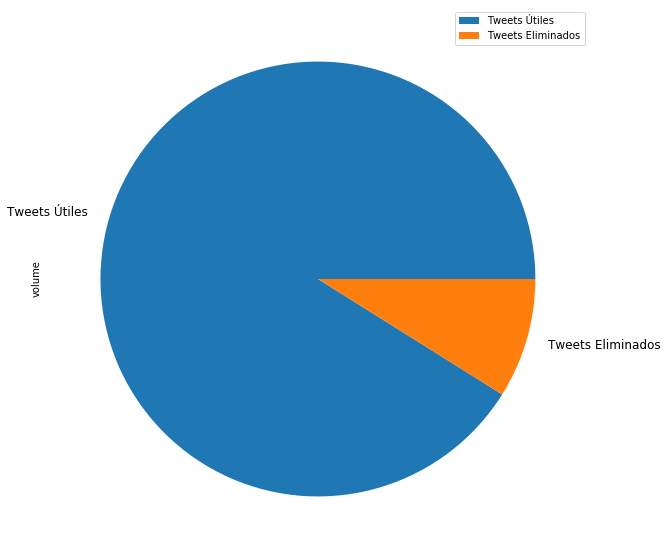

In [35]:
pie = pd.DataFrame({'volume': [df_result.Volume_Tweets_Useful.sum(), df_result.Volume_Tweets_Not_Useful.sum()]}, index=["Tweets Útiles", "Tweets Eliminados"])
plot = pie.plot.pie(y='volume', figsize=(10, 10), fontsize=12)

2. Se muestra el gráfico que compara el tamaño del texto de los tweets a lo largo del tiempo. Vemos como se mantiene aproximadamente constante, oscilando en ~100 caracteres. 

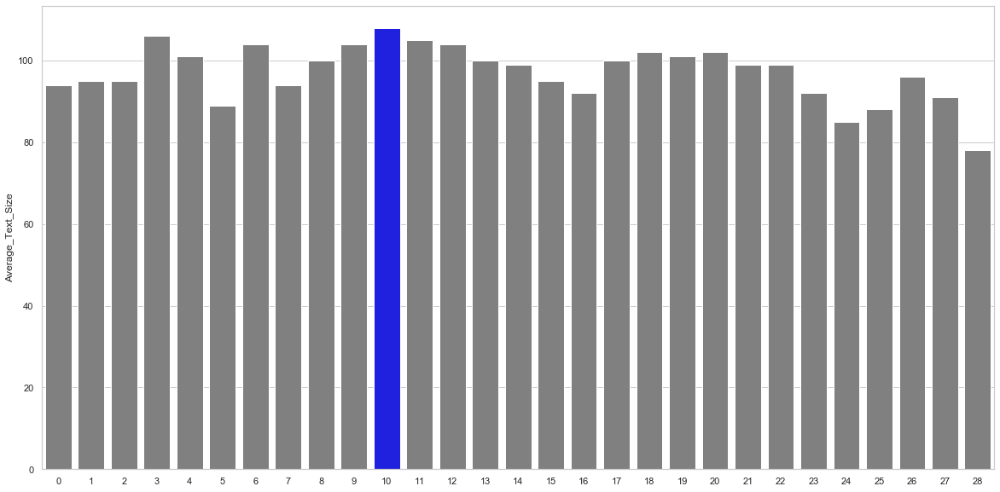

In [36]:
#Tamaño Promedio de Tweets por día:
plt.figure(figsize=(20,10))
sns.set(style=1. Se muestra el gráfico de los tweets útiles vs los eliminados en pasos anteriores."whitegrid")
clrs = ['grey' if (x < max(df_result.Average_Text_Size)) else 'blue' for x in df_result.Average_Text_Size]
sns.barplot(x=df_result[0:29].index, y="Average_Text_Size", data=df_result[0:29], palette=clrs)

3. Se muestra el gráfico que compara la cantidad de tweets NO útiles por día.

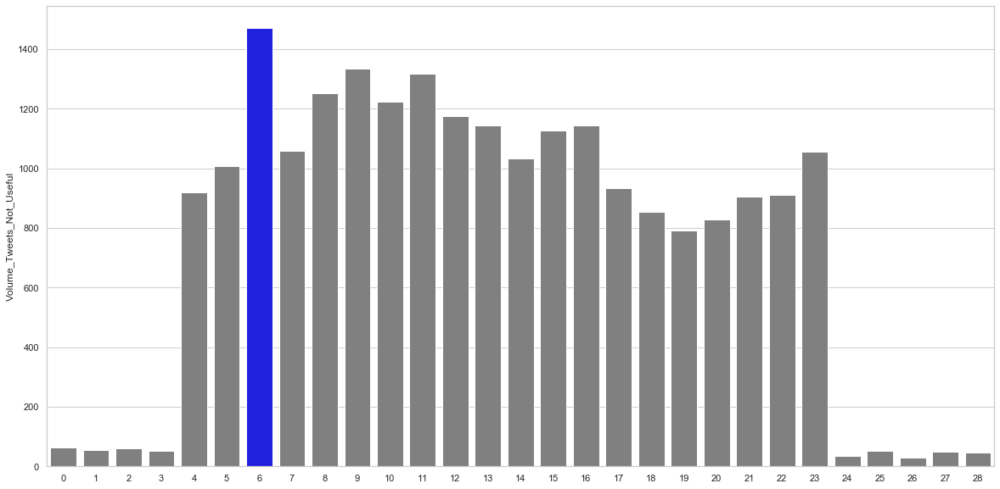

In [37]:
#Volumen de Tweets con solo Hashtag por día:
plt.figure(figsize=(20,10))
sns.set(style="wh2. Se muestra el gráfico que compara el tamaño del texto de los tweets a lo largo del tiempo. Vemos como se mantiene aproximadamente constante, oscilando en ~100 caracteres. itegrid")
clrs = ['grey' if (x < max(df_result.Volume_Tweets_Not_Useful)) else 'blue' for x in df_result.Volume_Tweets_Not_Useful]
sns.barplot(x=df_result[0:29].index, y="Volume_Tweets_Not_Useful", data=df_result[0:29], palette=clrs)
plt.show()

4. Se muestra el gráfico que compara la cantidad de tweets favoritos por día. La barra azul indica el máximo de tweets favoritos el día 02/06. Ese día coincide con la celebración del BlackoutTuesday.

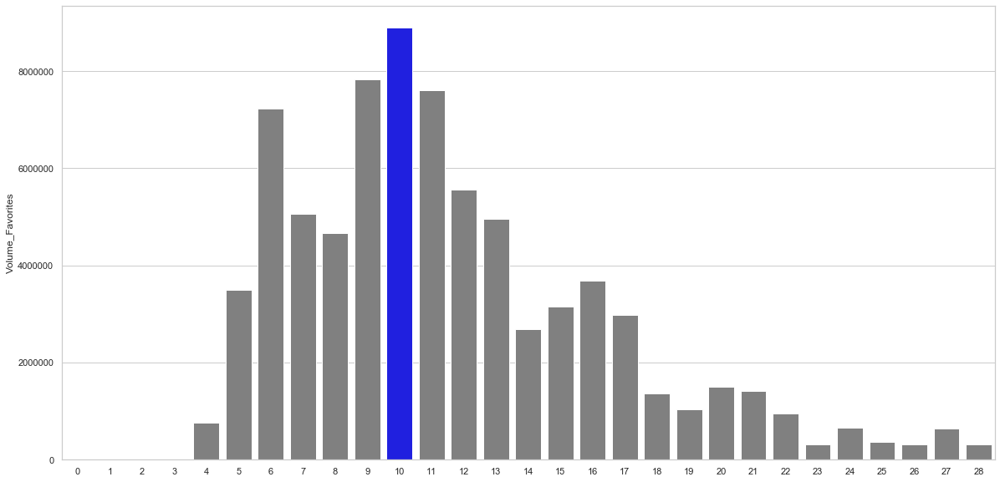

In [38]:
#Volumen de Tweets Favoritos por día:
plt3. Se muestra el gráfico que compara la cantidad de tweets no útiles por día..figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result.Volume_Favorites)) else 'blue' for x in df_result.Volume_Favorites]
sns.barplot(x=df_result[0:29].index, y="Volume_Favorites", data=df_result[0:29], palette=clrs)
plt.show()

5. Se muestra el gráfico que compara la cantidad de retweets por día. La barra azul indica el máximo de retweets el día 28/06. Ese día coincide con el inicio de la petición para recolectar firmas a favor de Justicia para George Floyd.

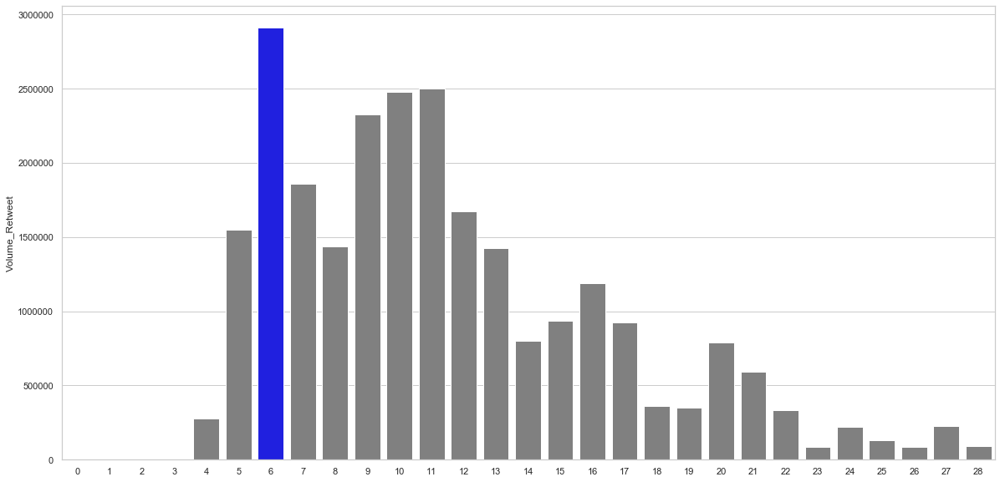

In [39]:
#Volumen de Retweets por día:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result.Volume_Retweet)) else 'blue' for x in df_result.Volume_Retweet]
sns.barplot(x=df_result[0:29].index, y="Volume_Retweet", data=df_result[0:29], palette=clrs)
plt.show()

A continuación se verifica en el dataset de #BlackLivesMatter, cuántos usuarios han utilizado el hashtag de #ACAB junto al de #BlackLivesMatter. Vemos que resulta en solo 968 usuarios de un total de 164,851. Esto nos hace pensar que no es común que miembros de BLM utilicen este hashtag ofensivo en sus tweets.

In [33]:
positive, neutral, negative = 0, 0, 0   
count = 0
user_list_ACAB = []
for i in range(0,len(dates)):
    date = dates[i]
    sentiment_analysis_dict = {}
    freq_hashtags = "#ACAB"
    for j in range(len(df_filter_trial_new['User'])):
        date_twitter = df_filter_trial_new['Date'][j]
        date_twitter = date_twitter[:10].strip()            
        if date_twitter == date:
            tweet_hashtags = set(df_filter_trial_new.Hashtags[j].split()) 
            tweet_hashtags = (list(tweet_hashtags))
            if (freq_hashtags in tweet_hashtags):
                count = count + 1
                user_list_ACAB.append(df_filter_trial_new.User[j])
                if (df_filter_trial_new["Polarity"][j] == "Negative"):
                    negative = negative + 1
                elif (df_filter_trial_new["Polarity"][j] == "Neutral"):
                    neutral = neutral + 1
                elif (df_filter_trial_new["Polarity"][j] == "Positive"):
                    positive = positive + 1

total = positive + negative + neutral
if total == 0:
    total = 1
user_list_ACAB = set(user_list_ACAB) 
user_list_ACAB = (list(user_list_ACAB))
print("Total de Tweets con Hashtag #ACAB:", count)
print("#ACAB Tweets Positivo(%)",int(100*(positive/total)))
print("#ACAB Tweets Negativo(%)",int(100*(negative/total)))
print("#ACAB Tweets Neutral(%)",int(100*(neutral/total)))

#Obtenemos los usuarios que se encuentran tanto en la base de BLM como en ACAB:

user_BLM_and_ACAB = set(df_filter_trial_new.User).intersection(set(df_filter_trial_new_ACAB.User))

total_users = set(df_filter_trial_new.User) 
total_users = (list(total_users))

print("Total de usuarios que han usado #BlackLivesMatter:", len(total_users))

print("El total de usuarios que han usado #BlackLivesMatter y #ACAB:", len(user_BLM_and_ACAB))

print("Total de Usuarios que han usado #BlackLivesMatter y #ACAB en el mismo tweet:",len(user_list_ACAB))

Total de Tweets con Hashtag #ACAB: 1039
#ACAB Tweets Positivo(%) 32
#ACAB Tweets Negativo(%) 52
#ACAB Tweets Neutral(%) 14
Total de usuarios que han usado #BlackLivesMatter: 164851
El total de usuarios que han usado #BlackLivesMatter y #ACAB: 5211
Total de Usuarios que han usado #BlackLivesMatter y #ACAB en el mismo tweet: 968


# 4. Análisis de Sentimientos: #BlackLivesMatter

Se utilizó la herramienta de análisis de sentimientos: **VADER (Valence Aware Dictionary y sEntiment Reasoner)**. Esta es una herramienta que se basa en analizar la combinación del léxico (palabras), que generalmente se etiquetan de acuerdo con su orientación semántica como positivas o negativas, para obtener la polaridad de un texto o mensaje. VADER ha sido especialmente entrenada con textos de redes sociales y se ha encontrado que es bastante exitoso cuando se trata de textos en redes sociales, editoriales, así como reseñas de películas y productos.
Repositorio: https://github.com/cjhutto/vaderSentiment

In [29]:
analyzer = SentimentIntensityAnalyzer()
scores, compound_list, positive_list, negative_list, neutral_list = [], [], [], [], []

for i in range(0,len(df_filter_trial['Clean_Data'])):
    compound = analyzer.polarity_scores(df_filter_trial['Clean_Data'][i])["compound"]
    pos = analyzer.polarity_scores(df_filter_trial['Clean_Data'][i])["pos"]
    neu = analyzer.polarity_scores(df_filter_trial['Clean_Data'][i])["neu"]
    neg = analyzer.polarity_scores(df_filter_trial['Clean_Data'][i])["neg"]
    scores.append({"Compound": compound, "Positive": pos, "Negative": neg, "Neutral": neu})

sentiments_score = pd.DataFrame.from_dict(scores)
df_filter_trial_new = df_filter_trial.join(sentiments_score)

df_filter_trial_new["Polarity"] = 0
for i in range(0,len(df_filter_trial["Hashtags"])):
    if (df_filter_trial_new["Compound"][i] >= 0.05):
        df_filter_trial_new["Polarity"][i] = "Positive"
    elif ((df_filter_trial_new["Compound"][i] > -0.05) and (df_filter_trial_new["Compound"][i] < 0.05)):
        df_filter_trial_new["Polarity"][i] = "Neutral"
    elif (df_filter_trial_new["Compound"][i] <= -0.05):
        df_filter_trial_new["Polarity"][i] = "Negative"
        
#Analizamos los resultados de polaridad de los tweets por día.
sentiment_analysis, positive_date, negative_date, neutral_date = [], [], [], []    
for i in range(0,len(dates)):
    total_tweets, positive, neutral, negative = 0, 0, 0, 0
    date = dates[i]
    sentiment_analysis_dict = {}
    for j in range(len(df_filter_trial_new['User'])):
        date_twitter = df_filter_trial_new['Date'][j]
        date_twitter = date_twitter[:10].strip()
        if date_twitter == date:
            if (df_filter_trial_new["Polarity"][j] == "Negative"):
                negative = negative + 1
            elif (df_filter_trial_new["Polarity"][j] == "Neutral"):
                neutral = neutral + 1
            elif (df_filter_trial_new["Polarity"][j] == "Positive"):
                positive = positive + 1
    
    total_tweets = df_summary.Volume_Tweets_Useful[i]
    if total_tweets == 0:
        total_tweets = 1
    sentiment_analysis_dict['Date'] = dates[i]
    sentiment_analysis_dict['Tweets_Negativos'] = negative
    sentiment_analysis_dict['Tweets_Neutrales'] = neutral
    sentiment_analysis_dict['Tweets_Positivos'] = positive
    sentiment_analysis_dict['Tweets_Negativos(%)'] = int(100*(negative/total_tweets))
    sentiment_analysis_dict['Tweets_Neutrales(%)'] = int(100*(neutral/total_tweets))
    sentiment_analysis_dict['Tweets_Positivos(%)'] = int(100*(positive/total_tweets))
    sentiment_analysis.append(sentiment_analysis_dict)
    
df_sentiment = pd.DataFrame(sentiment_analysis)

#Unimos ambos datasets de análisis diario:
df_result = pd.merge(df_summary, df_sentiment)

In [29]:
#Verificamos el dataset de todos los tweets de #BlackLivesMatter con los nuevos datos de polaridad.
df_filter_trial_new.head()

,ID,User,Text_Original,Text_Original_Size,Date,Favorites,Retweets,Mentions,Hashtags,Clean_Data,Clean_Data_Size,Tokens,Tokens_Stem,Compound,Positive,Negative,Neutral,Polarity
0,1263972587396358146,KaileeScales,Clearly we need Black representation on the to...,128,2020-05-22 23:18:42+00:00,210,43,@JoeBiden,#BlackLivesMatter #BlackLivesMatter #whatmatte...,Clearly need Black representation the top tick...,70,"[clearly, need, black, representation, top, ti...","[clear, need, black, represent, top, ticket, b...",0.5423,0.333,0.000,0.667,Positive
1,1263962674406264837,BuddyWinston,"Trump's website is now selling ""You Ain't Blac...",238,2020-05-22 22:39:19+00:00,51,19,,#Biden2020 #BlackLivesMatter #BlackLivesMatter...,Trump website now selling You Ain Black Joe Bi...,117,"[trump, website, selling, black, joe, biden, s...","[trump, websit, sell, black, joe, biden, shirt...",0.0000,0.000,0.000,1.000,Neutral
2,1263939630476390400,PlatypiPolitics,Australian media- Will tell you about a white ...,212,2020-05-22 21:07:45+00:00,40,3,,#BlackLivesMatter #BlackLivesMatter,Australian media Will tell you about white Aus...,167,"[australian, medium, tell, white, australian, ...","[australian, medium, tell, white, australian, ...",-0.7430,0.104,0.252,0.644,Negative
3,1263915392122130435,Blklivesmatter,We are not waiting on others...we holding a me...,242,2020-05-22 19:31:26+00:00,123,41,,#WhatMatters #BlackLivesMatter #BlackLivesMatt...,are not waiting others holding megaphone OUR i...,135,"[waiting, others, holding, megaphone, issue, a...","[wait, other, hold, megaphon, issu, affect, co...",0.0000,0.000,0.000,1.000,Neutral
4,1263908853441232896,vashtij_,Kenneth Walker is a hero!!! A black man protec...,115,2020-05-22 19:05:27+00:00,38,12,,#breonataylor #BlackLivesMatter #BlackLivesMatter,Kenneth Walker hero black man protecting black...,62,"[kenneth, walker, hero, black, man, protecting...","[kenneth, walker, hero, black, man, protect, b...",0.7543,0.446,0.000,0.554,Positive


In [36]:
#Verificamos el dataset de análisis diario sobre #BlackLivesMatter con los nuevos datos de polaridad.
df_result.head()

,Date,Average_Text_Size,Volume_Retweet,Volume_Favorites,Users_Most_Retweet,Users_Most_Favorites,Volume_Tweets_Useful,Volume_Tweets_Not_Useful,Frequent_Hashtags,Frequent_Mentions,Tweets_Negativos,Tweets_Neutrales,Tweets_Positivos,Tweets_Negativos(%),Tweets_Neutrales(%),Tweets_Positivos(%)
0,2020-05-22,94,1190,3709,lexcoupe96,thxitsthetrauma,711,63,"[#BlackLivesMatter, #BlackTwitter, #blacklives...","[@JoeBiden, @realDonaldTrump, @DNC, @GOP, @CNN...",329,142,240,46,19,33
1,2020-05-23,95,833,1756,ZinnEdProject,ZinnEdProject,511,55,"[#BlackLivesMatter, #BlackTwitter, #blacklives...","[@JoeBiden, @realDonaldTrump, @Official1SP, @t...",218,91,202,42,17,39
2,2020-05-24,95,1479,3096,BuddyWinston,BuddyWinston,421,60,"[#BlackLivesMatter, #blacklivesmatter, #BlackT...","[@JoeBiden, @DNC, @BarackObama, @realDonaldTru...",187,70,164,44,16,38
3,2020-05-25,106,2038,10735,AmieMFbrown,AmieMFbrown,569,53,"[#BlackLivesMatter, #blacklivesmatter, #blackh...","[@BarackObama, @realDonaldTrump, @JoeBiden, @D...",294,81,194,51,14,34
4,2020-05-26,101,278515,760690,flywithkamala,flywithkamala,8892,920,"[#BlackLivesMatter, #GeorgeFloyd, #blacklivesm...","[@MinneapolisPD, @realDonaldTrump, @MayorFrey,...",5849,998,2045,65,11,22


## Gráficos

1. Se muestra el gráfico que compara la cantidad de tweets **Negativos** por día. La barra roja indica el máximo de tweets negativos el día 26/05, un día después del asesinato de George Floyd.

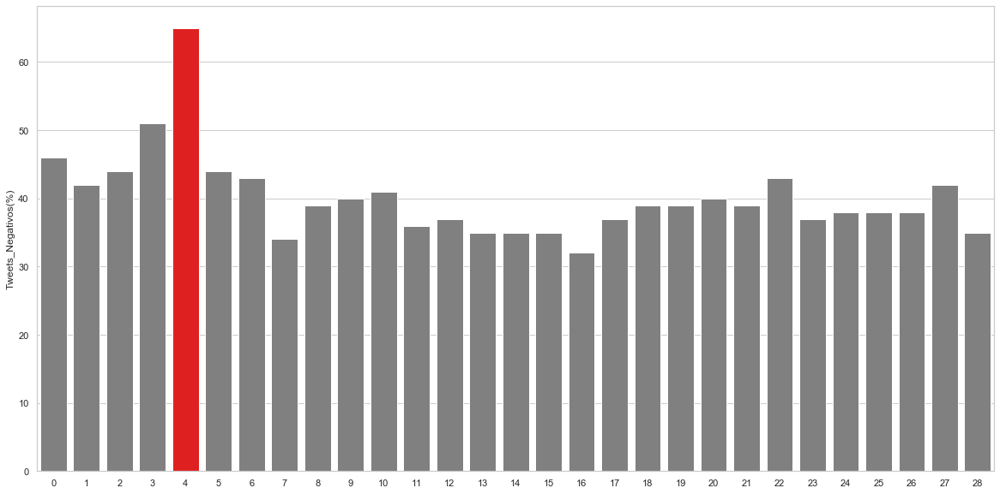

In [40]:
#Tweets Negativos:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result["Tweets_Negativos(%)"])) else 'red' for x in df_result["Tweets_Negativos(%)"]]
sns.barplot(x## Gráfic## Gráficosos=df_result[0:29].index, y="Tweets_Negativos(%)", data=df_result[0:29], palette=clrs)
plt.show()

2. Se muestra el gráfico que compara la cantidad de tweets **Positivos** por día. Las barras verdes indican el máximo de tweets positivos entre el 03/06 y el 08/06 que son días posteriores al BlackoutTusday y durante los cuales también se recordó el que sería el cumpleaños de Breonna Taylor (también asesinada en un contexto similar).

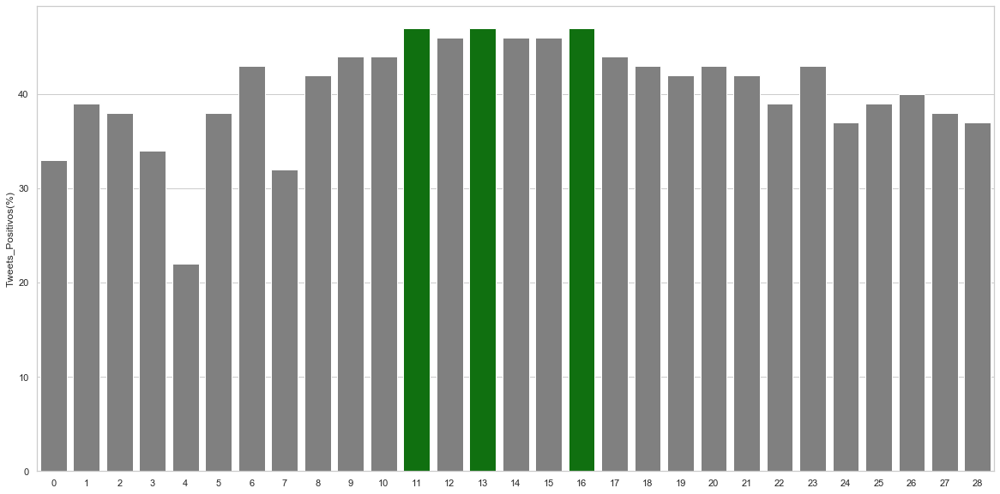

In [52]:
#Tweets Positivos:
plt.figure(figsize=(20,10))
sns.set(s1. Se muestra el gráfico que compara la cantidad de tweets Negativos por día. La barra roja indica el máximo de tweets negativos el día 26/05, el cual es un día después del asesinato de George Floyd.tyle="whitegrid")
clrs = ['grey' if (x < max(df_result["Tweets_Positivos(%)"])) else 'green' for x in df_result["Tweets_Positivos(%)"]]
sns.barplot(x=df_result[0:29].index, y="Tweets_Positivos(%)", data=df_result[0:29], palette=clrs)
plt.show()

3. Se muestra el gráfico que compara la cantidad de tweets **Neutros** por día. La barra amarilla indican el máximo de tweets neutros el 29/05 que es un día después de inicializada la petición para recolectar firmas a favor de Justicia para George Floyd.

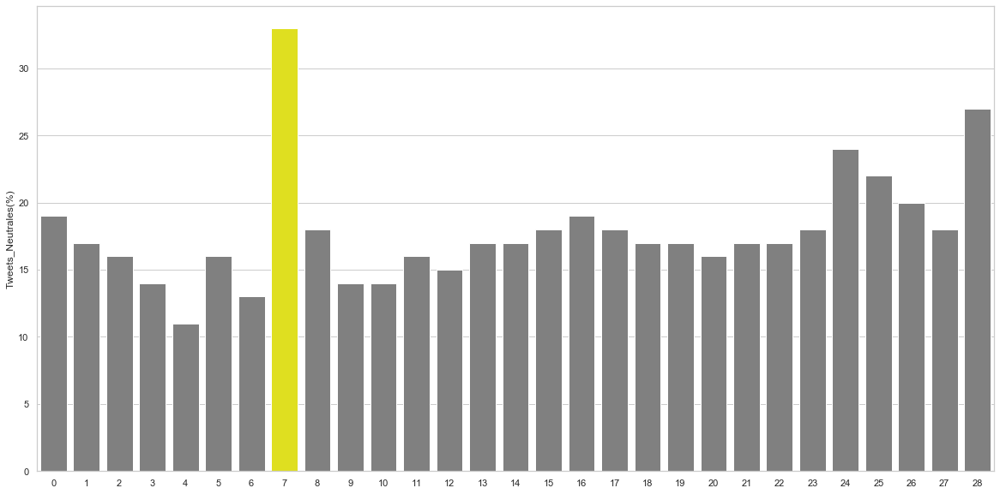

In [53]:
#Tweets Neutros:
plt.figure(figsize=(20,10))
sns.set(sty2. Se muestra el gráfico que compara la cantidad de tweets Positivos por día. Las barras verdes indican el máximo de tweets positivos entre el 03/06 y el 08/06 que son días posteriores al BlackoutTusday y durante los cuales también se recordó el que sería el cumpleaños de Breonna Taylor (también asesinada en un contexto similar).le="whitegrid")
clrs = ['grey' if (x < max(df_result["Tweets_Neutrales(%)"])) else 'yellow' for x in df_result["Tweets_Neutrales(%)"]]
sns.barplot(x=df_result[0:29].index, y="Tweets_Neutrales(%)", data=df_result[0:29], palette=clrs)
plt.show()

4. Se muestra el gráfico que compara el porcentaje de tweets Positivos, Neutros y Negativos a los largo de los días evaluados. Se puede observar cómo es que inicialmente hay mayor volumen de tweets negativos en torno a los días posteriores al asesinato de George Floyd, para posteriormente disminuir y dejar paso a los tweets positivos como mayoría.

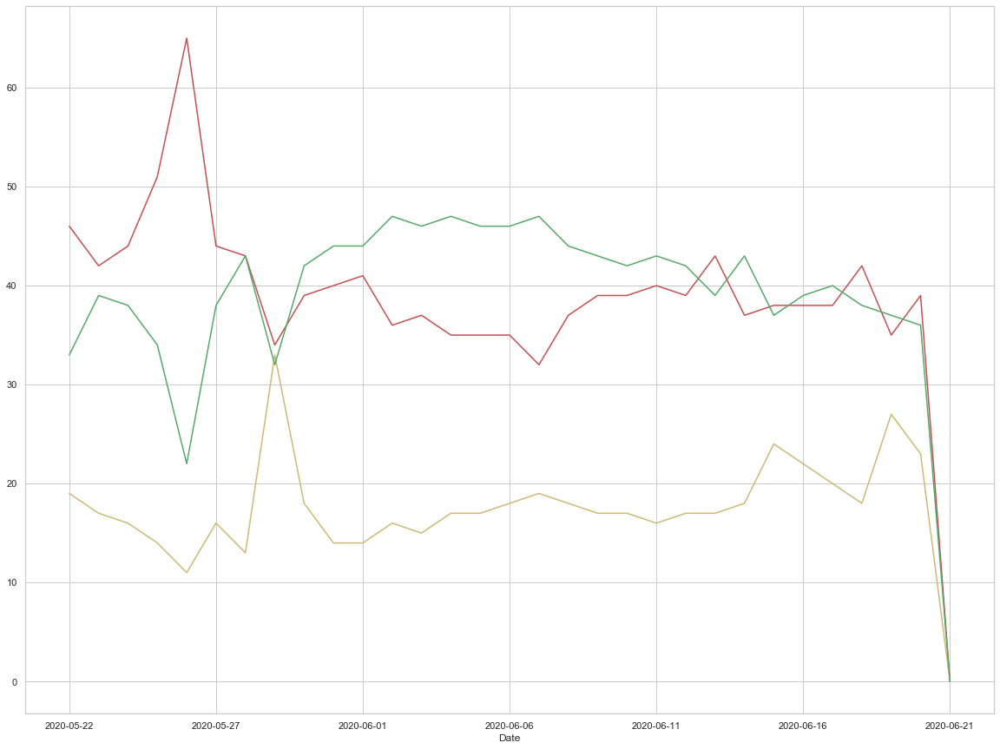

In [41]:
#Tweets Negativos:
time_favorites_date = pd.Series(data=np.array(df_result["Tweets_Negativos(%)"]), index=df_result["Date"])
time_favorites_date.plot(figsize=(20,15), label = "Negativos", color="r")
#Tweets Neutros:
time_retweets_date = pd.Series(data=np.array(df_result["Tweets_Neutrales(%)"]), index=df_result["Date"])
time_retweets_date.plot(figsize=(20,1**5), label = "Neutrales", color="y")
#Tweets Positivos:
n_tweets_date = pd.Series(data=np.array(df_result["Tweets_Positivos(%)"]), index=df_result["Date"])
n_tweets_date.plot(figsize=(20,15), label = "Positivos", color="g")
plt.show()

5. La siguiente gráfica de acumulación para los tweets Positivos, Negativos y Neutros se construye en base a la misma información que la anterior. Se puede observar que alrededor de los días 04/06 y 05/06 los tweets positivos sobrepasan a los negativos.

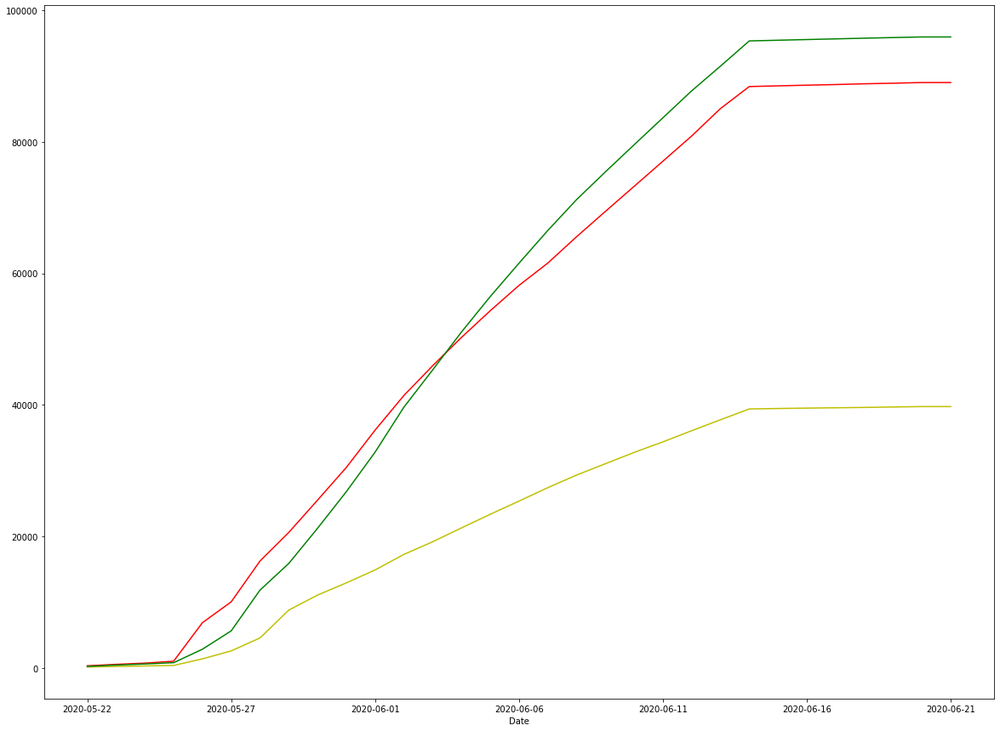

In [24]:
#Graficamos la información acumulada de polarización (neutro, positivo, negativo) en el tiempo:
sum_neg, sum_neu, sum_pos = 0, 0, 0
neg, neu, pos = [], [], []
for i in range(len(dates)):
    sum_neg = sum_neg +  df_result.Tweets_Negativos[i]
    sum_neu = sum_neu +  df_result.Tweets_Neutrales[i]
    sum_pos = sum_pos +  df_result.Tweets_Positivos[i]
    neg.append(sum_neg)
    neu.append(sum_neu)
    pos.append(sum_pos) 
#Tweets Negativos:
time_favorites_date = pd.Series(data=np.array(neg), index=df_result["Date"])
time_favorites_date.plot(figsize=(20,15), label = "Negativos", color="r")
#Tweets Neutros:
time_retweets_date = pd.Series(data=np.array(neu), index=df_result["Date"])
time_retweets_date.plot(figsize=(20,15), label = "Neutrales", color="y")
#Tweets Positivos:
n_tweets_date = pd.Series(data=np.array(pos), index=df_result["Date"])
n_tweets_date.plot(figsize=(20,15), label = "Positivos", color="g")
plt.show()

Se analiza el porcentaje de tweets positivos, negativos y neutros asociados a los hashtags más relevantes por cada uno de los días evaluados. En la presentación (PPT) se pueden visualizar los resultados de mejor manera.

In [66]:
#Analizamos el porcentaje de Positivismo, Neutralidad y Negativismo por Hashtag durante cada día.
most_positive, most_negative, most_neutral = 0, 0, 0
hashtag_positivo, hashtag_negative, hashtag_neutral = 0, 0, 0
for i in range(0,len(dates)):
    date = dates[i]
    sentiment_analysis_dict = {}
    freq_hashtags = df_result.Frequent_Hashtags[i]
    for k in range(len(freq_hashtags)):
        positive, neutral, negative = 0, 0, 0       
        for j in range(len(df_filter_trial_new['User'])):
            date_twitter = df_filter_trial_new['Date'][j]
            date_twitter = date_twitter[:10].strip()            
            if date_twitter == date:
                tweet_hashtags = set(df_filter_trial_new.Hashtags[j].split()) 
                tweet_hashtags = (list(tweet_hashtags))
                if (freq_hashtags[k] in tweet_hashtags):
                    if (df_filter_trial_new["Polarity"][j] == "Negative"):
                        negative = negative + 1
                    elif (df_filter_trial_new["Polarity"][j] == "Neutral"):
                        neutral = neutral + 1
                    elif (df_filter_trial_new["Polarity"][j] == "Positive"):
                        positive = positive + 1
        
        if (positive > most_positive):
            most_positive = positive
            hashtag_positivo = freq_hashtags[k]
        if (neutral > most_neutral):
            most_neutral = neutral
            hashtag_neutral = freq_hashtags[k]
        if (negative > most_negative):
            most_negative = negative
            hashtag_negative = freq_hashtags[k]
    
        total = positive + negative + neutral
        print("Día:", i+1)
        print("Fecha:", date)
        print("Hashtag:",freq_hashtags[k])
        print("Positivo",int(100*(positive/total)))
        print("Negativo",int(100*(negative/total)))
        print("Neutral",int(100*(neutral/total)))
        print("-----------")
    
print("Hashtag más Positivo",hashtag_positivo)
print("Hashtag más Negativo",hashtag_negative)
print("Hashtag más Neutral",hashtag_neutral)
    

Día: 1
Fecha: 2020-05-22
Hashtag: #BlackLivesMatter
Positivo 32
Negativo 46
Neutral 20
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #BlackTwitter
Positivo 32
Negativo 37
Neutral 29
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #blacklivesmatter
Positivo 39
Negativo 44
Neutral 16
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #AhmaudArbery
Positivo 19
Negativo 61
Neutral 19
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #coronavirus
Positivo 45
Negativo 32
Neutral 22
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #BlackLivesMatter
Positivo 38
Negativo 42
Neutral 18
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #BlackTwitter
Positivo 48
Negativo 34
Neutral 16
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #blacklivesmatter
Positivo 43
Negativo 39
Neutral 17
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #Biden2020
Positivo 35
Negativo 39
Neutral 25
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #coronavirus
Positivo 41
Negativo 41
Neutral 16
-----------
Día: 3
Fecha: 2020-05-24
Hashtag: #Blac

# 5. Análisis de Tópicos:  #BlackLivesMatter

Se utilizó el algoritmo de aprendizaje no supervisado **LDA (Latent Dirichlet Allocation)** para realizar el análisis de los tópicos más relevantes durante los días evaluados. Después de varias pruebas variando los hiperparámetros (alpha, betha, número de tópicos y número de iteraciones con los datos) y comparando Bag of Words (BOW) y TFIDF para generar el "corpus", se obtuvieron los siguientes resultados.

In [32]:
#Utilizamos TFIDF para crear el corpus.
tweets_dict = corpora.Dictionary(df_filter_trial['Tokens'])

NUM_TOPICS = 15
NUM_PASSES = 15 
ALPHA = 0.1
ETA = 'auto'

bow_corpus = [tweets_dict.doc2bow(token_tweet) for token_tweet in df_filter_trial['Tokens']]
tfidf = models.TfidfModel(bow_corpus)
tfidf_corpus = tfidf[bow_corpus]

ldamodel = models.ldamodel.LdaModel(tfidf_corpus, 
                                    num_topics = NUM_TOPICS, 
                                    id2word=tweets_dict, 
                                    passes=NUM_PASSES,
                                    alpha=ALPHA, 
                                    eta=ETA,
                                    random_state=49)

topics = ldamodel.print_topics(num_words=4)

for topic in topics:
    print(topic)

(0, '0.044*"sign" + 0.033*"petition" + 0.027*"breonna" + 0.027*"taylor"')
(1, '0.018*"police" + 0.015*"peaceful" + 0.012*"protect" + 0.011*"brutality"')
(2, '0.013*"reform" + 0.013*"listening" + 0.012*"shot" + 0.011*"running"')
(3, '0.020*"life" + 0.020*"matter" + 0.017*"black" + 0.010*"people"')
(4, '0.016*"money" + 0.016*"check" + 0.014*"link" + 0.014*"donate"')
(5, '0.011*"like" + 0.010*"people" + 0.009*"racist" + 0.009*"black"')
(6, '0.018*"question" + 0.018*"employee" + 0.018*"far" + 0.016*"donation"')
(7, '0.013*"agree" + 0.013*"thank" + 0.012*"follow" + 0.011*"twitter"')
(8, '0.017*"black" + 0.015*"police" + 0.014*"killed" + 0.012*"man"')
(9, '0.047*"break" + 0.042*"chain" + 0.033*"know" + 0.023*"people"')
(10, '0.041*"via" + 0.020*"real" + 0.019*"president" + 0.017*"vote"')
(11, '0.023*"thanks" + 0.018*"marching" + 0.018*"powerful" + 0.015*"company"')
(12, '0.015*"finally" + 0.015*"crowd" + 0.014*"showing" + 0.014*"lynching"')
(13, '0.016*"rally" + 0.016*"na" + 0.014*"birthday"

In [34]:
lda_display = pyLDAvis.gensim.prepare(ldamodel, tfidf_corpus, tweets_dict, sort_topics=False)
pyLDAvis.display(lda_display)

In [39]:
#Utilizamos BOW para crear el corpus.
tweets_dict = corpora.Dictionary(df_filter_trial['Tokens'])

NUM_TOPICS = 20
NUM_PASSES = 15 
ALPHA = 0.1
ETA = 'auto'

bow_corpus = [tweets_dict.doc2bow(token_tweet) for token_tweet in df_filter_trial['Tokens']]

ldamodel = models.ldamodel.LdaModel(bow_corpus, 
                                    num_topics = NUM_TOPICS, 
                                    id2word=tweets_dict, 
                                    passes=NUM_PASSES,
                                    alpha=ALPHA, 
                                    eta=ETA,
                                    random_state=49)

topics = ldamodel.print_topics(num_words=4)

for topic in topics:
    print(topic)

(0, '0.201*"say" + 0.120*"year" + 0.072*"name" + 0.047*"remember"')
(1, '0.078*"racist" + 0.041*"week" + 0.028*"together" + 0.028*"far"')
(2, '0.059*"like" + 0.039*"people" + 0.037*"stop" + 0.028*"right"')
(3, '0.074*"support" + 0.069*"movement" + 0.051*"love" + 0.042*"thank"')
(4, '0.071*"change" + 0.049*"real" + 0.046*"need" + 0.040*"action"')
(5, '0.050*"many" + 0.030*"power" + 0.028*"others" + 0.026*"amazing"')
(6, '0.071*"racism" + 0.051*"people" + 0.039*"world" + 0.038*"white"')
(7, '0.070*"want" + 0.052*"said" + 0.044*"anyone" + 0.044*"proud"')
(8, '0.080*"community" + 0.064*"stand" + 0.045*"fight" + 0.039*"black"')
(9, '0.080*"please" + 0.052*"keep" + 0.051*"help" + 0.048*"sign"')
(10, '0.106*"know" + 0.049*"new" + 0.047*"still" + 0.039*"well"')
(11, '0.059*"one" + 0.057*"day" + 0.036*"every" + 0.025*"time"')
(12, '0.071*"via" + 0.028*"happy" + 0.023*"thanks" + 0.022*"car"')
(13, '0.060*"march" + 0.053*"great" + 0.042*"video" + 0.041*"state"')
(14, '0.110*"justice" + 0.044*"geo

In [41]:
lda_display = pyLDAvis.gensim.prepare(ldamodel, tfidf_corpus, tweets_dict, sort_topics=False)
pyLDAvis.display(lda_display)

# 2. Limpieza de Textos: #ACAB

Se realizaron los siguientes pasos para la limpieza de texto de los tweets:
1. Eliminar tweets con **texto duplicado** de la base de datos.
2. Realizar **limpieza y tokenización** del texto a detalle.
3. Eliminar los tweets que tengan **menos de 20 caracteres** ya que no se consideran valiosos para el análisis.

In [70]:
#Calculamos la cantidad de tweets repetidos y eliminamos duplicados:
df_trial_ACAB = df_ACAB.copy()
print("Porcentaje Tweets duplicados por texto para #ACAB:", 100*(df_trial_ACAB[df_trial_ACAB.duplicated(subset ="Text_Original")].User.count())/df_trial_ACAB.User.count())
df_trial_ACAB.drop_duplicates(subset ="Text_Original", inplace = True)
df_trial_ACAB.index = range(len(df_trial_ACAB.Text_Original))
print("Tweets disponibles para #ACAB:", df_trial_ACAB.User.count())

Porcentaje Tweets duplicados por texto para #ACAB: 1.757192830219378
Tweets disponibles para #ACAB: 108687


In [39]:
#Realizamos la tokenización y limpieza de los datos:
clean_data = 0
tokens = [] 
tokens_stem = []
df_trial_ACAB['Clean_Data'] = 0
df_trial_ACAB['Clean_Data_Size'] = 0
df_trial_ACAB['Tokens'] = "0"
df_trial_ACAB['Tokens_Stem'] = "0"
for i in range(0,len(df_trial_ACAB.Text_Original)):
    clean_data, tokens, tokens_stem = Limpieza_Tokenizacion(df_trial_ACAB.Text_Original[i], 'english', df_trial_ACAB.Hashtags[i], df_trial_ACAB.Mentions[i])
    df_trial_ACAB['Clean_Data'][i] = clean_data
    df_trial_ACAB['Clean_Data_Size'][i] = len(clean_data)
    df_trial_ACAB['Tokens'][i] = tokens
    df_trial_ACAB['Tokens_Stem'][i] = tokens_stem

In [40]:
#Obtenemos el diccionario de tokens:
tokens = []
for i in range(len(df_trial_ACAB.Text_Original)):
    tokens.extend(df_trial_ACAB.Tokens[i])
unique_tokens = set(tokens) 
unique_tokens = (list(unique_tokens))
print("Número de tokens para #ACAB:", len(unique_tokens))

Número de tokens: 32304


In [46]:
#Calculamos la cantidad de tweets (con texto limpio) que no tienen información útil (tamaño menor a 20 caracteres) y los eliminamos:
df_filter_trial_ACAB = df_trial_ACAB[df_trial_ACAB['Clean_Data_Size'] >= 20]
df_filter_trial_ACAB.index = range(len(df_filter_trial_ACAB.Clean_Data_Size))
print("Porcentaje de Tweets no útiles:", 100*((df_trial_ACAB.Clean_Data_Size.count()-df_filter_trial_ACAB.Clean_Data_Size.count())/df_trial_ACAB.Clean_Data_Size.count()))
print("Tweets Disponibles:", df_filter_trial_ACAB.Clean_Data_Size.count())

Porcentaje de Tweets no útiles: 11.33162199711097
Tweets Disponibles: 96371


# 3. Análisis Exploratorio:  #ACAB

Se realizó el análisis de los tweets por cada uno de los días evaluados, considerando lo siguiente:
1. Hashtags más frecuentes.
2. Menciones más frecuentes.
3. Promedio de caracteres.
4. Volumen de retweets.
5. Volumen de tweets favoritos.
6. Volumen de tweets NO útiles vs tweets útiles.
7. Usuario con más retweets.
8. Usuario con más tweets favoritos.
9. Tamaño de texto promedio.

In [41]:
tweets_analysis = []
n_favorites_date, n_retweets_date, n_tweets_date = [], [], []
hashtag_date, mention_date, retweet_date, favorite_date = [], [], [], []

for i in range(0,len(dates)):
    tweets_analysis_dict = {}
    num_tweets = 1
    num_favorites, num_retweets, text_size, num_tweets_useful = 0, 0, 0, 0
    hashtag_date, mention_date, retweet_date, favorite_date = [], [], [], []
    mayor_retweet, mayor_favorite = 0, 0
    date = dates[i]
    for j in range(len(df_trial_ACAB['User'])):
        date_twitter = df_trial_ACAB['Date'][j]
        date_twitter = date_twitter[:10].striSe realizó el análisis de los tweets por cada uno de los días evaluados, considerando lo siguiente:
1. Hashtags más frecuentes.
2. Menciones más frecuentes.
3. Promedio de caracteres.
4. Volumen de retweets.
5. Volumen de tweets favoritos.
6. Volumen de tweets NO útiles vs tweets útiles.
7. Usuario con más retweets.
8. Usuario con más tweets favoritos.
9. Tamaño de texto promedio.p()
        if date_twitter == date:
            num_tweets = num_tweets + 1
            text_size = text_size + df_trial_ACAB["Clean_Data_Size"][j]
            num_favorites = num_favorites + df_trial_ACAB["Favorites"][j]
            num_retweets = num_retweets + df_trial_ACAB["Retweets"][j]
            if (df_trial_ACAB['Clean_Data_Size'][j] >= 20):
                num_tweets_useful = num_tweets_useful + 1  
            if (df_trial_ACAB["Retweets"][j] > mayor_retweet):
                mayor_retweet = df_trial_ACAB["Retweets"][j]
                retweet_date = df_trial_ACAB["User"][j]
            if (df_trial_ACAB["Favorites"][j] > mayor_favorite):
                mayor_favorite = df_trial_ACAB["Favorites"][j]
                favorite_date = df_trial_ACAB["User"][j]
            hashtags = [tag for tag in df_trial_ACAB.Hashtags[j].split() if tag.startswith("#")]
            hashtags = list(dict.fromkeys(hashtags))
            mentions = [tag for tag in df_trial_ACAB.Mentions[j].split() if tag.startswith("@")]
            mentions = list(dict.fromkeys(mentions))
            hashtag_date.extend(hashtags)
            mention_date.extend(mentions)
                
    hashtag_counter = {}
    for hashtag in hashtag_date:
        if hashtag in hashtag_counter:
            hashtag_counter[hashtag] += 1
        else:
            hashtag_counter[hashtag] = 1
    popular_hashtags = sorted(hashtag_counter, key = hashtag_counter.get, reverse = True)

    mention_counter = {}
    for mention in mention_date:
        if mention in mention_counter:
            mention_counter[mention] += 1
        else:
            mention_counter[mention] = 1
    popular_mention = sorted(mention_counter, key = mention_counter.get, reverse = True)
    
    tweets_analysis_dict['Date'] = dates[i]
    tweets_analysis_dict['Average_Text_Size'] = int(text_size/num_tweets)
    tweets_analysis_dict['Volume_Retweet'] = num_retweets
    tweets_analysis_dict['Volume_Favorites'] = num_favorites
    tweets_analysis_dict['Users_Most_Retweet'] = retweet_date
    tweets_analysis_dict['Users_Most_Favorites'] = favorite_date
    tweets_analysis_dict['Volume_Tweets_Useful'] = num_tweets_useful
    tweets_analysis_dict['Volume_Tweets_Not_Useful'] = num_tweets - num_tweets_useful
    tweets_analysis_dict['Frequent_Hashtags'] = popular_hashtags[:5]
    tweets_analysis_dict['Frequent_Mentions'] = popular_mention[:5]
    tweets_analysis.append(tweets_analysis_dict)
    
df_summary_ACAB = pd.DataFrame(tweets_analysis)

In [42]:
df_summary_ACAB.head()

,Date,Average_Text_Size,Volume_Retweet,Volume_Favorites,Users_Most_Retweet,Users_Most_Favorites,Volume_Tweets_Useful,Volume_Tweets_Not_Useful,Frequent_Hashtags,Frequent_Mentions
0,2020-05-22,72,42,364,eelk,mustachetoilet,50,13,"[#ACAB, #acab, #FTP, #coronavirus, #ftp]","[@RadioOutbreak, @GLBouchez, @alicesperi, @spd..."
1,2020-05-23,67,82,365,ultras_antifaa,ultras_antifaa,37,6,"[#ACAB, #acab, #FTP, #ftp, #BlackLivesMatter]",[]
2,2020-05-24,70,37,272,lacorteindialdr,Mindhealer2,33,7,"[#ACAB, #acab, #FTP, #BlackTwitter, #allcopsar...",[]
3,2020-05-25,81,133,869,ultras_antifaa,ultras_antifaa,46,10,"[#ACAB, #acab, #Karen, #okkaren, #chantalclaret]",[@tiktok_us]
4,2020-05-26,91,3804,13753,CrabsCrab1,TrafficVigilan1,350,44,"[#ACAB, #acab, #BlackLivesMatter, #GeorgeFloyd...","[@MinneapolisPD, @YouTube, @ILLB1LL, @_LordGoa..."


Se obtuvieron los hashtags y menciones más frecuentes en el dataset para ver qué otros temas acompañaban el hashtag principal. En la presentación (PPT) se muestra algunos de los hashtags más importantes y sus significados.

In [43]:
#Obtenemos los hashtags más frecuentes de todos los días evaluados:
hashtags = []
for i in range(len(df_summary_ACAB.Frequent_Hashtags)):
    hashtags.extend(df_summary_ACAB.Frequent_Hashtags[i])
unique_hashtags = set(hashtags) 
unique_hashtags = (list(unique_hashtags))
print("Hashtags más comunes de los 30 días evaluados:", unique_hashtags)

Hashtags más comunes de los 30 días evaluados: ['#GeorgeFloyd', '#chantalclaret', '#blacklivesmatter', '#ACAB', '#BLM', '#blm', '#BlackTwitter', '#DefundThePolice', '#Karen', '#JusticeForGeorgeFloyd', '#okkaren', '#FTP', '#BlackLivesMatter', '#allcopsarebastards', '#BLACK_LIVES_MATTER', '#coronavirus', '#acab', '#JusticeForGeorgeFlyod', '#ftp', '#BlackLivesMattter']


In [44]:
#Obtenemos las menciones más frecuentes de todos los días evaluados:
mentions = []
for i in range(len(df_summary_ACAB.Frequent_Mentions)):
    mentions.extend(df_summary_ACAB.Frequent_Mentions[i])
unique_mentions = set(mentions) 
unique_mentions = (list(unique_mentions))
print("Hashtags más comunes de los 30 días evaluados:", unique_mentions)

Hashtags más comunes de los 30 días evaluados: ['@IGD_News', '@RichmondPolice', '@NYGovCuomo', '@PortlandPolice', '@MayorJenny', '@theconvocouch', '@YouTube', '@PhillyPolice', '@Atlanta_Police', '@spd', '@Change', '@FortWaynePolice', '@TorrancePD', '@LASDHQ', '@tiktok_us', '@realDonaldTrump', '@LevarStoney', '@hkpoliceforce', '@alicesperi', '@NYPDnews', '@YourAnonNews', '@Wendys', '@yn_prop', '@TulsaPolice', '@MinneapolisPD', '@Fiorella_im', '@MayorFrey', '@RadioOutbreak', '@UR_Ninja', '@CNN', '@_LordGoat', '@GLBouchez', '@KeishaBottoms', '@albertoespina', '@jfg_nyc', '@tedwheeler', '@protest_nyc', '@stxalq', '@MilwaukeePolice', '@YourAnonCentral', '@ILLB1LL', '@NonPhixionNYC', '@nswpolice', '@LMPD', '@BPDAlerts', '@meetBLK', '@UKChange', '@SeattlePD', '@CharlestonPD', '@shakeshack', '@JoeBiden', '@PortlandFence', '@MNFreedomFund', '@NYCMayor', '@StateBarofGA']


Se generó una nube de palabras por cada uno de los días evaluados para analizar qué palabras son las más frecuentes y si se relacionan al contexto temporal. En la presentación (PPT) se muestra la línea de tiempo que se genera con estos gráficos.

Fecha: 2020-05-22


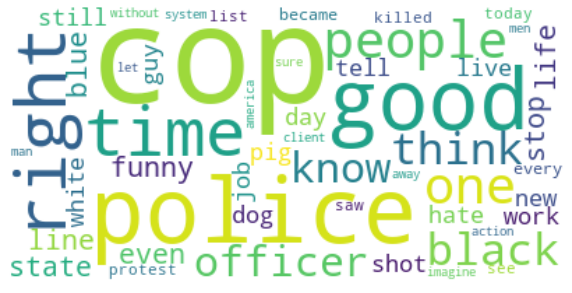

Fecha: 2020-05-23


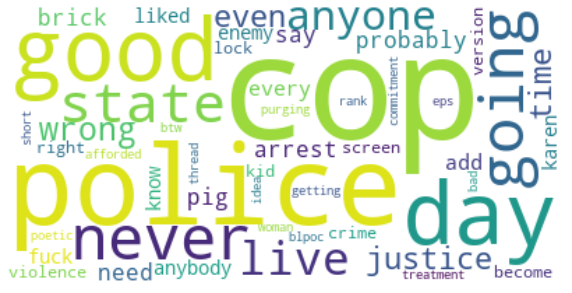

Fecha: 2020-05-24


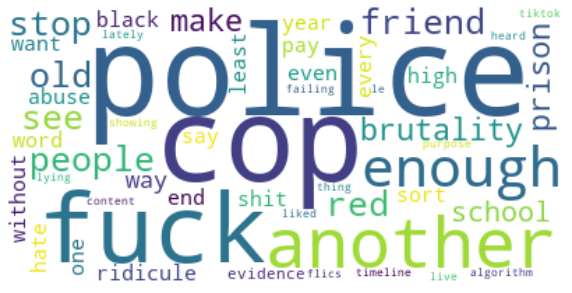

Fecha: 2020-05-25


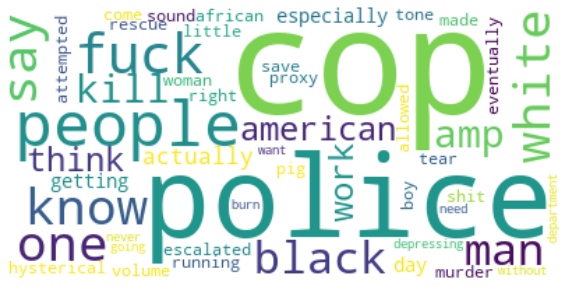

Fecha: 2020-05-26


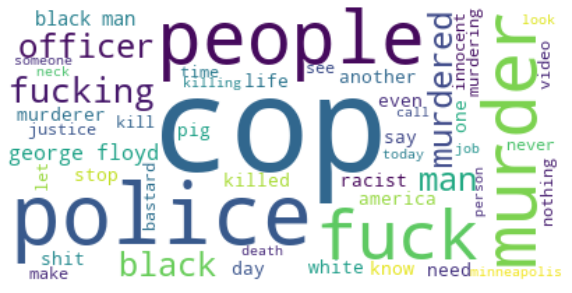

Fecha: 2020-05-27


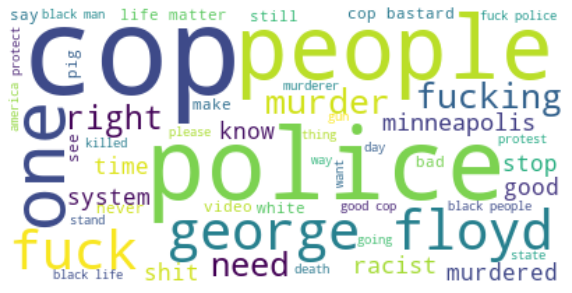

Fecha: 2020-05-28


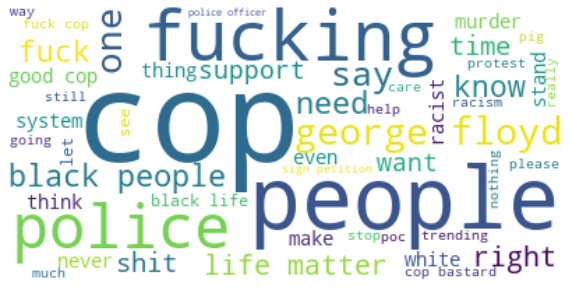

Fecha: 2020-05-29


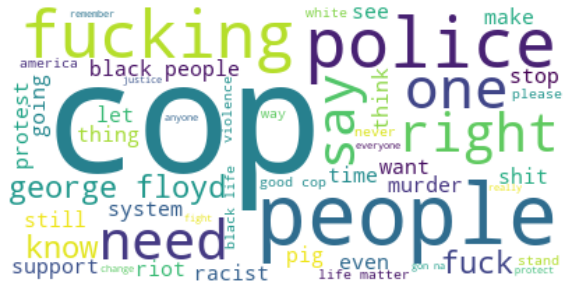

Fecha: 2020-05-30


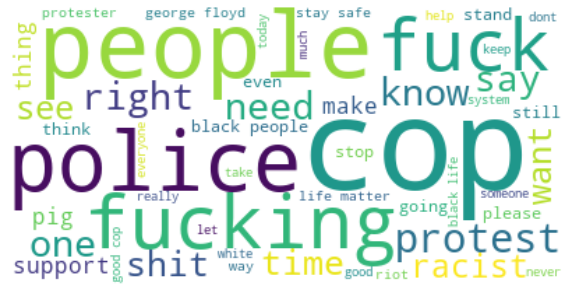

Fecha: 2020-05-31


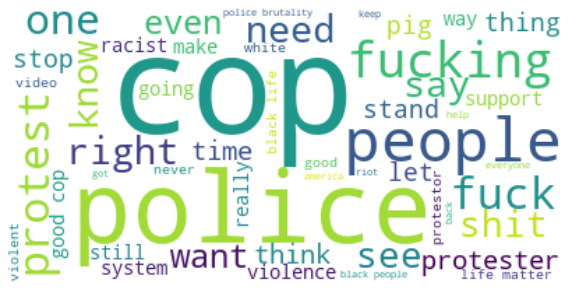

Fecha: 2020-06-01


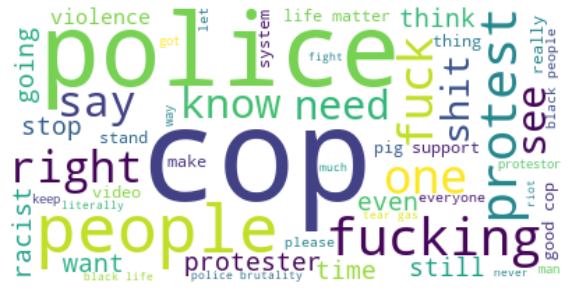

Fecha: 2020-06-02


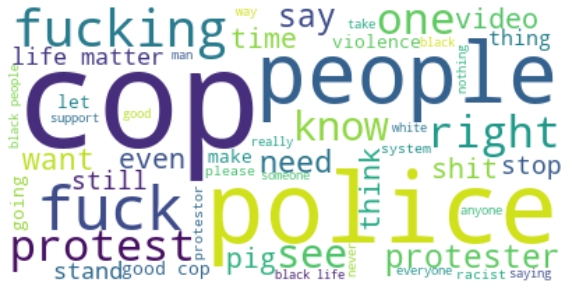

Fecha: 2020-06-03


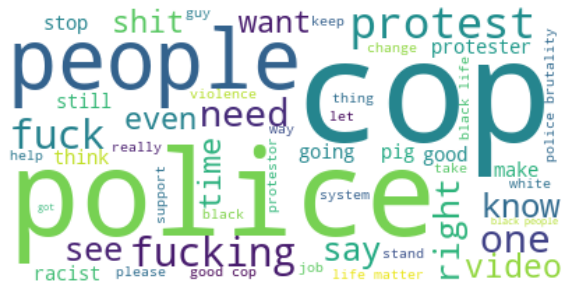

Fecha: 2020-06-04


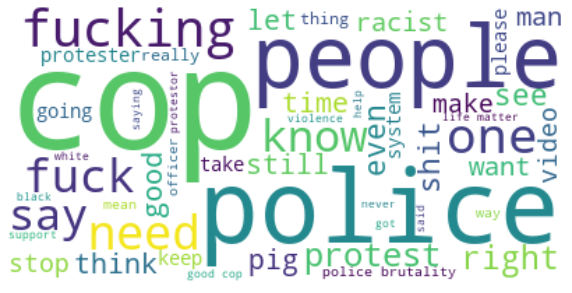

Fecha: 2020-06-05


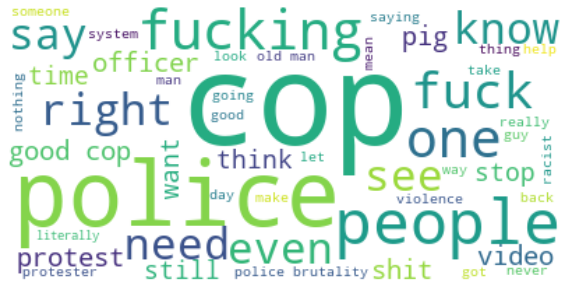

Fecha: 2020-06-06


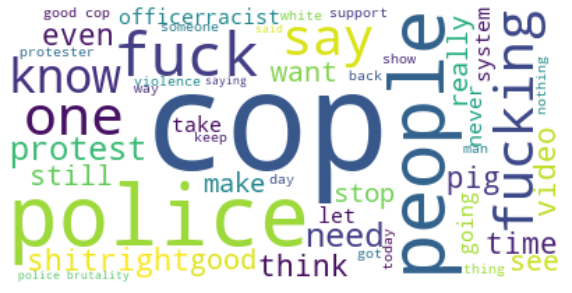

Fecha: 2020-06-07


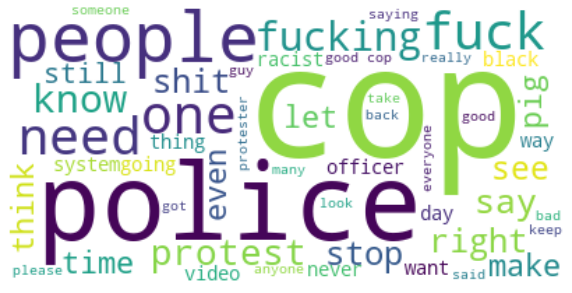

Fecha: 2020-06-08


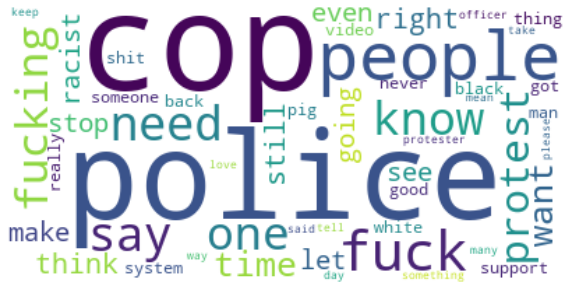

Fecha: 2020-06-09


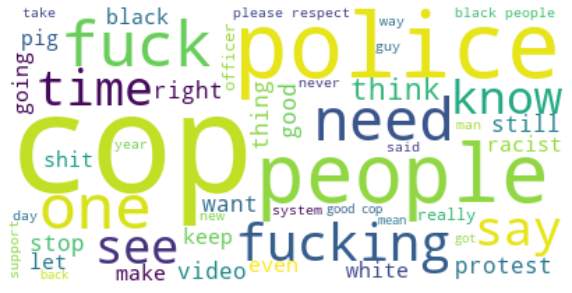

Fecha: 2020-06-10


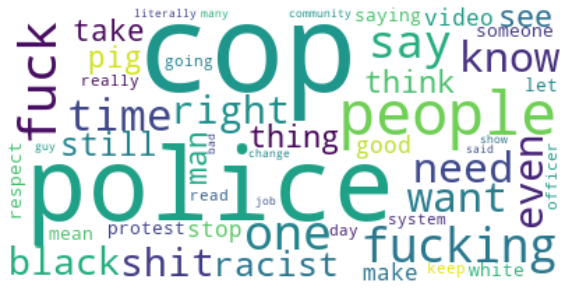

Fecha: 2020-06-11


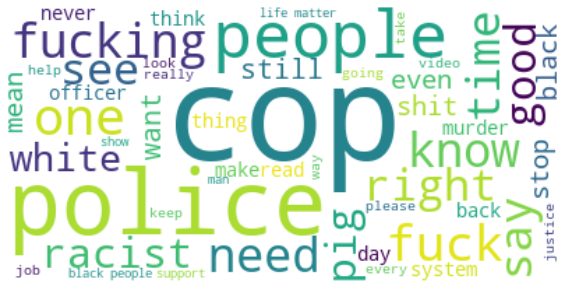

Fecha: 2020-06-12


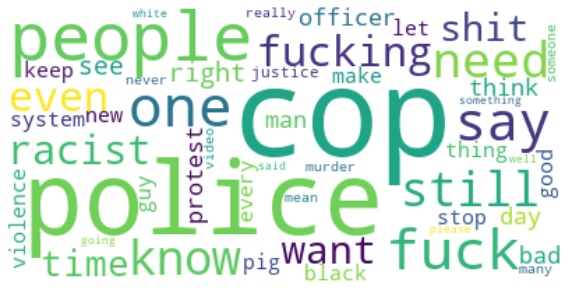

Fecha: 2020-06-13


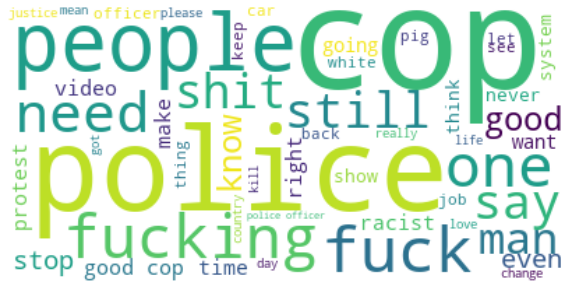

Fecha: 2020-06-14


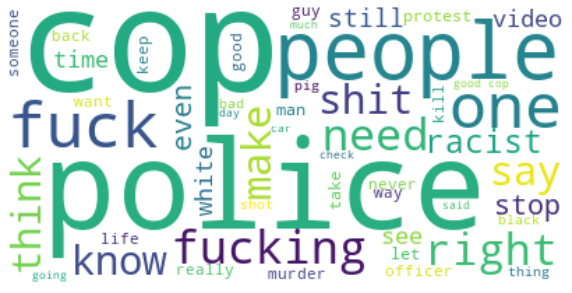

Fecha: 2020-06-15


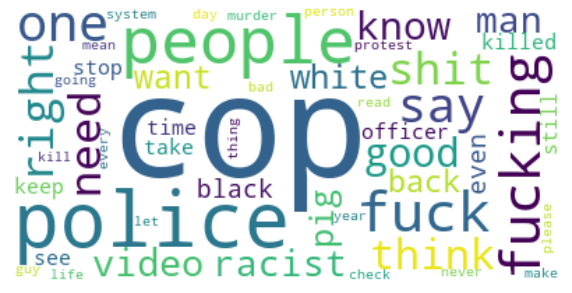

Fecha: 2020-06-16


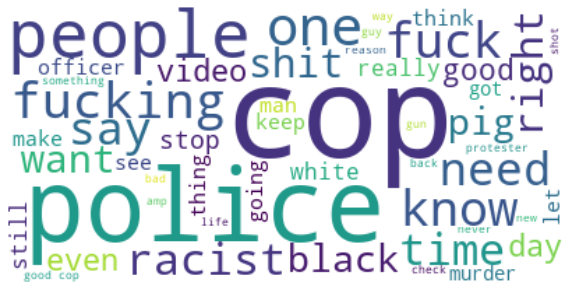

Fecha: 2020-06-17


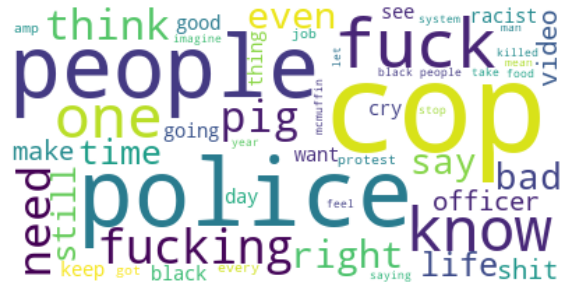

Fecha: 2020-06-18


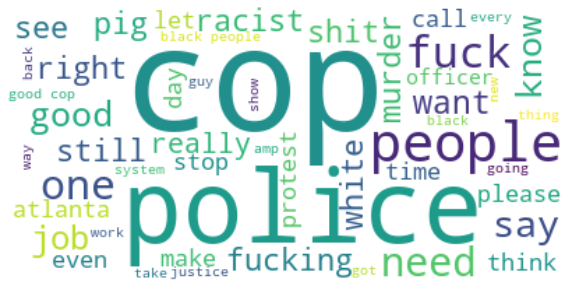

Fecha: 2020-06-19


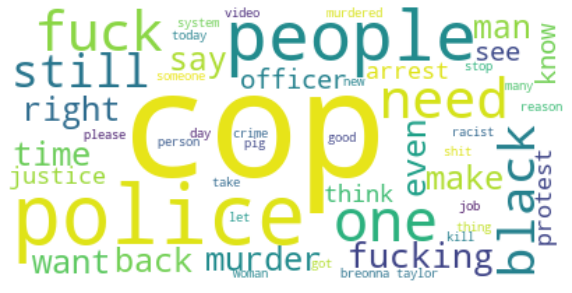

Fecha: 2020-06-20


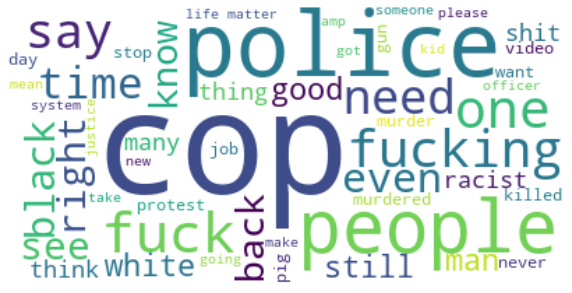

Fecha: 2020-06-21


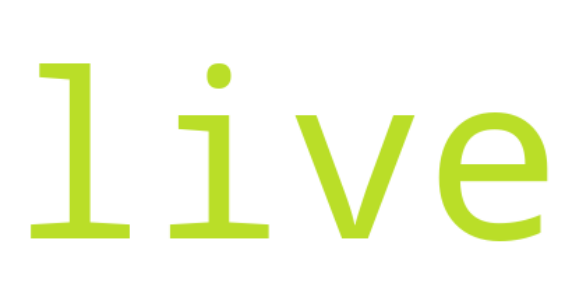

In [47]:
#Generamos una nube de palabras para cada uno de los días evaluados, utilizamos los tokens que han sido procesados:
for i in range(0,len(dates)):
    date = dates[i]
    content = ["live"]
    for j in range(len(df_filter_trial_ACAB["User"])):
        date_twitter = df_filter_trial_ACAB["Date"][j]
        date_twitter = date_twitter[:10].strip()
        if date_twitter == date:
            content.extend(df_filter_trial_ACAB["Tokens"][j])
    wordcloud = WordCloud(max_words=50,background_color="white").generate(' '.join(content))
    print("Fecha:",date)
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## 3.1 Gráficos

1. Se muestra el gráfico de los tweets útiles vs los eliminados en pasos anteriores.

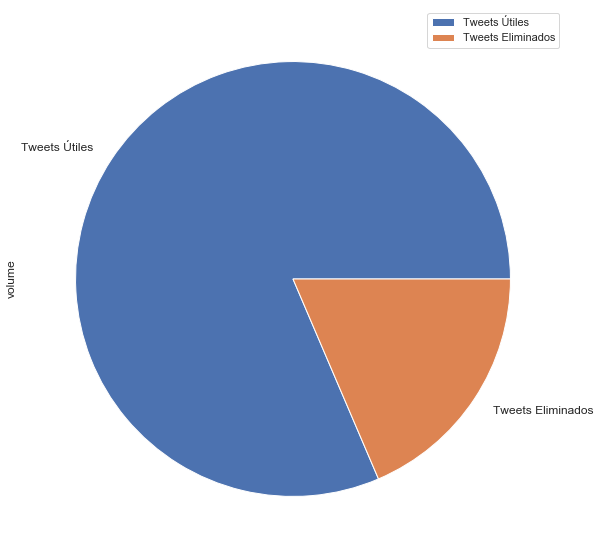

In [78]:
pie = pd.DataFrame({'volume': [df_result_ACAB.Volume_Tweets_Useful.sum(), df_result.Volume_Tweets_Not_Useful.sum()]}, index=["Tweets Útiles", "Tweets Eliminados"])
plot = pie.plot.pie(y='volume', figsize=(10, 10), fontsize=12)

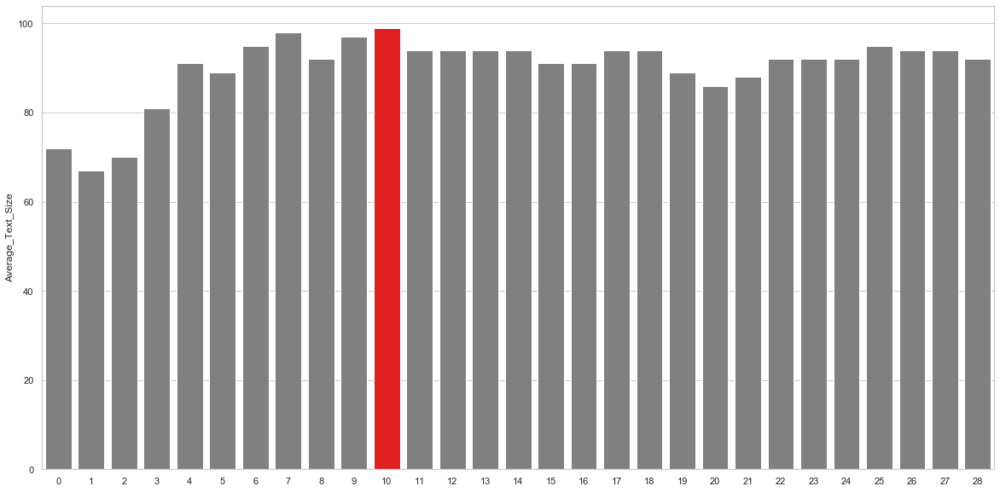

In [72]:
#Tamaño Promedio de Tweets por día:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB.Average_Text_Size)) else 'red' for x in df_result_ACAB.Average_Text_Size]
sns.barplot(x=df_result_ACAB[0:29].index, y="Average_Text_Size", data=df_result_ACAB[0:29], palette=clrs)

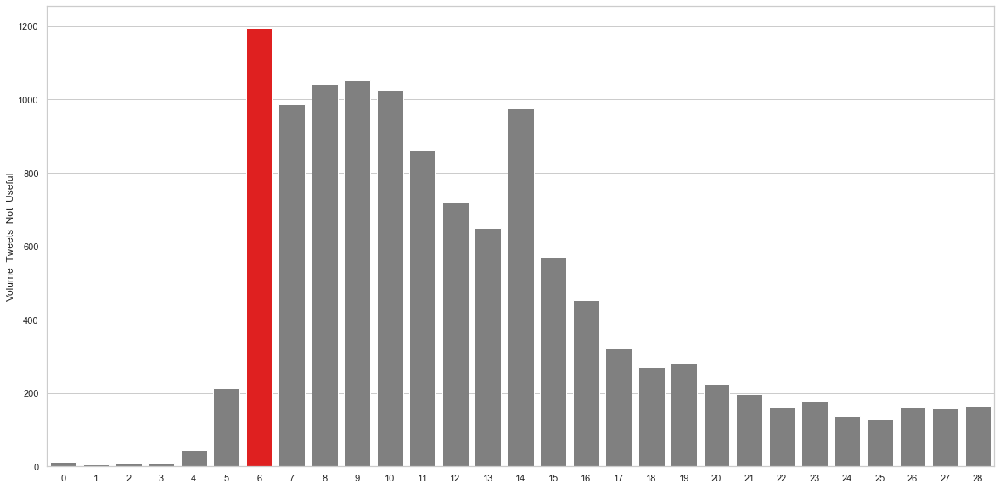

In [73]:
#Volumen de Tweets con solo Hashtag por día:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB.Volume_Tweets_Not_Useful)) else 'red' for x in df_result_ACAB.Volume_Tweets_Not_Useful]
sns.barplot(x=df_result_ACAB[0:29].index, y="Volume_Tweets_Not_Useful", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

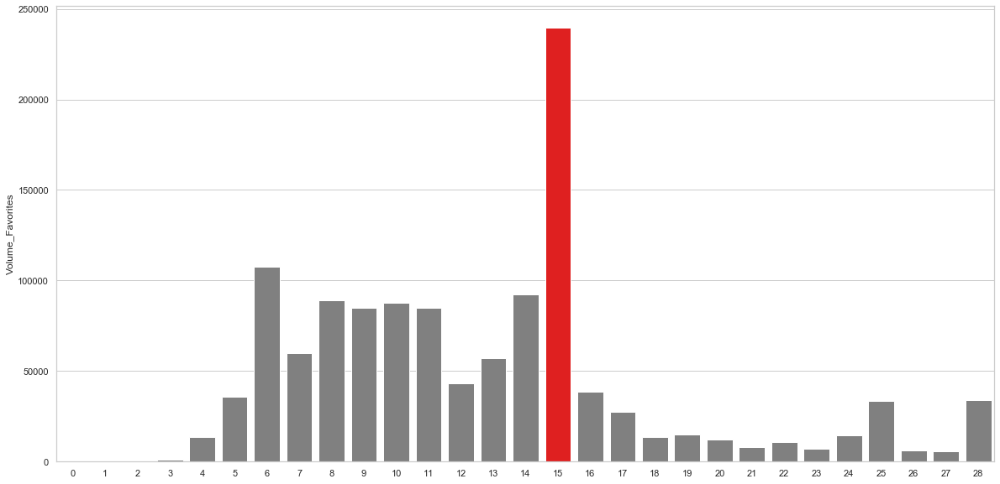

In [74]:
#Volumen de Tweets Favoritos por día:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB.Volume_Favorites)) else 'red' for x in df_result_ACAB.Volume_Favorites]
sns.barplot(x=df_result_ACAB[0:29].index, y="Volume_Favorites", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

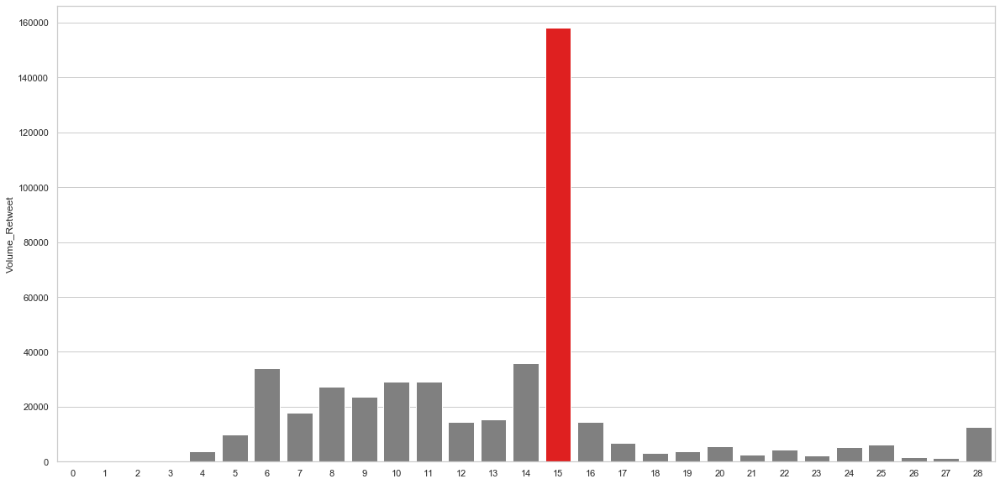

In [75]:
#Volumen de Retweets por día:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB.Volume_Retweet)) else 'red' for x in df_result_ACAB.Volume_Retweet]
sns.barplot(x=df_result_ACAB[0:29].index, y="Volume_Retweet", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

A continuación se verifica en el dataset de #ACAB, cuántos usuarios han utilizado el hashtag de #BlackLivesMatter junto al de #ACAB. Vemos que resulta en 19,403 usuarios de un total de 61,802. Esto nos hace pensar que es común que miembros de ACAB utilicen ese hashtag ofensivo junto #BlackLivesMatter en sus tweets.

In [40]:
positive, neutral, negative = 0, 0, 0   
count = 0
user_list_BLM = []
for i in range(0,len(dates)):
    date = dates[i]
    sentiment_analysis_dict = {}
    freq_hashtags = ["#BlackLivesMatter","blm","BLM", "#blacklivesmatter"]
    for k in range(len(freq_hashtags)):
        for j in range(len(df_filter_trial_new_ACAB['User'])):
            date_twitter = df_filter_trial_new_ACAB['Date'][j]
            date_twitter = date_twitter[:10].strip()            
            if date_twitter == date:
                tweet_hashtags = set(df_filter_trial_new_ACAB.Hashtags[j].split()) 
                tweet_hashtags = (list(tweet_hashtags))
                if (freq_hashtags[k] in tweet_hashtags):
                    count = count + 1
                    user_list_BLM.append(df_filter_trial_new_ACAB.User[j])
                    if (df_filter_trial_new_ACAB["Polarity"][j] == "Negative"):
                        negative = negative + 1
                    elif (df_filter_trial_new_ACAB["Polarity"][j] == "Neutral"):
                        neutral = neutral + 1
                    elif (df_filter_trial_new_ACAB["Polarity"][j] == "Positive"):
                        positive = positive + 1

total = positive + negative + neutral
if total == 0:
    total = 1
user_list_BLM = set(user_list_BLM) 
user_list_BLM = (list(user_list_BLM))
print("Total de Tweets con Hashtag #ACAB:", count)
print("#ACAB Tweets Positivo(%)",int(100*(positive/total)))
print("#ACAB Tweets Negativo(%)",int(100*(negative/total)))
print("#ACAB Tweets Neutral(%)",int(100*(neutral/total)))

#Obtenemos los usuarios que se encuentran tanto en la base de BLM como en ACAB:

user_BLM_and_ACAB = set(df_filter_trial_new.User).intersection(set(df_filter_trial_new_ACAB.User))

total_users = set(df_filter_trial_new_ACAB.User) 
total_users = (list(total_users))

print("Total de usuarios que han usado #ACAB:", len(total_users))

print("El total de usuarios que han usado #BlackLivesMatter y #ACAB:", len(user_BLM_and_ACAB))

print("Total de Usuarios que han usado #BlackLivesMatter y #ACAB en el mismo tweet:",len(user_list_BLM))

Total de Tweets con Hashtag #ACAB: 26690
#ACAB Tweets Positivo(%) 33
#ACAB Tweets Negativo(%) 51
#ACAB Tweets Neutral(%) 15
Total de usuarios que han usado #ACAB: 61802
El total de usuarios que han usado #BlackLivesMatter y #ACAB: 5211
Total de Usuarios que han usado #BlackLivesMatter y #ACAB en el mismo tweet: 19403


# 4. Análisis de Sentimientos: #ACAB

Se utilizó la herramienta de análisis de sentimientos: **VADER (Valence Aware Dictionary y sEntiment Reasoner)**. Esta es una herramienta que se basa en analizar la combinación del léxico (palabras), que generalmente se etiquetan de acuerdo con su orientación semántica como positivas o negativas, para obtener la polaridad de un texto o mensaje. VADER ha sido especialmente entrenada con textos de redes sociales y se ha encontrado que es bastante exitoso cuando se trata de textos en redes sociales, editoriales, así como reseñas de películas y productos.
Repositorio: https://github.com/cjhutto/vaderSentiment

In [48]:
#Utilizamos el# Análisis de Sentimientos: #BlackLivesMatter modelo de Analisis de Sentimientos VADER (Valence Aware Dictionary and sEntiment Reasoner) que ha sido especialmente entrenado con datos
#de redes sociales para obtener la polaridad de las opiniones en los tweets.

analyzer = SentimentIntensityAnalyzer()
scores, compound_list, positive_list, negative_list, neutral_list = [], [], [], [], []

for i in range(0,len(df_filter_trial_ACAB['Clean_Data'])):
    compound = analyzer.polarity_scores(df_filter_trial_ACAB['Clean_Data'][i])["compound"]
    pos = analyzer.polarity_scores(df_filter_trial_ACAB['Clean_Data'][i])["pos"]
    neu = analyzer.polarity_scores(df_filter_trial_ACAB['Clean_Data'][i])["neu"]
    neg = analyzer.polarity_scores(df_filter_trial_ACAB['Clean_Data'][i])["neg"]
    scores.append({"Compound": compound, "Positive": pos, "Negative": neg, "Neutral": neu})

sentiments_score = pd.DataFrame.from_dict(scores)
df_filter_trial_new_ACAB = df_filter_trial_ACAB.join(sentiments_score)

df_filter_trial_new_ACAB["Polarity"] = 0
for i in range(0,len(df_filter_trial_ACAB["Hashtags"])):
    if (df_filter_trial_new_ACAB["Compound"][i] >= 0.05):
        df_filter_trial_new_ACAB["Polarity"][i] = "Positive"
    elif ((df_filter_trial_new_ACAB["Compound"][i] > -0.05) and (df_filter_trial_new_ACAB["Compound"][i] < 0.05)):
        df_filter_trial_new_ACAB["Polarity"][i] = "Neutral"
    elif (df_filter_trial_new_ACAB["Compound"][i] <= -0.05):
        df_filter_trial_new_ACAB["Polarity"][i] = "Negative"
        
#Analizamos los resultados de polaridad de los tweets por día.
sentiment_analysis_ACAB, positive_date, negative_date, neutral_date = [], [], [], []    

for i in range(0,len(dates)):
    total_tweets, positive, neutral, negative = 0, 0, 0, 0
    date = dates[i]
    sentiment_analysis_dict = {}
    for j in range(len(df_filter_trial_new_ACAB['User'])):
        date_twitter = df_filter_trial_new_ACAB['Date'][j]
        date_twitter = date_twitter[:10].strip()
        if date_twitter == date:
            if (df_filter_trial_new_ACAB["Polarity"][j] == "Negative"):
                negative = negative + 1
            elif (df_filter_trial_new_ACAB["Polarity"][j] == "Neutral"):
                neutral = neutral + 1
            elif (df_filter_trial_new_ACAB["Polarity"][j] == "Positive"):
                positive = positive + 1
    
    total_tweets = df_summary_ACAB.Volume_Tweets_Useful[i]
    if total_tweets == 0:
        total_tweets = 1
    sentiment_analysis_dict['Date'] = dates[i]
    sentiment_analysis_dict['Tweets_Negativos'] = negative
    sentiment_analysis_dict['Tweets_Neutrales'] = neutral
    sentiment_analysis_dict['Tweets_Positivos'] = positive
    sentiment_analysis_dict['Tweets_Negativos(%)'] = int(100*(negative/total_tweets))
    sentiment_analysis_dict['Tweets_Neutrales(%)'] = int(100*(neutral/total_tweets))
    sentiment_analysis_dict['Tweets_Positivos(%)'] = int(100*(positive/total_tweets))
    sentiment_analysis_ACAB.append(sentiment_analysis_dict)
    
df_sentiment_ACAB = pd.DataFrame(sentiment_analysis_ACAB)

df_result_ACAB = pd.merge(df_summary_ACAB, df_sentiment_ACAB)

In [49]:
df_result_ACAB.head()

,Date,Average_Text_Size,Volume_Retweet,Volume_Favorites,Users_Most_Retweet,Users_Most_Favorites,Volume_Tweets_Useful,Volume_Tweets_Not_Useful,Frequent_Hashtags,Frequent_Mentions,Tweets_Negativos,Tweets_Neutrales,Tweets_Positivos,Tweets_Negativos(%),Tweets_Neutrales(%),Tweets_Positivos(%)
0,2020-05-22,72,42,364,eelk,mustachetoilet,50,13,"[#ACAB, #acab, #FTP, #coronavirus, #ftp]","[@RadioOutbreak, @GLBouchez, @alicesperi, @spd...",24,10,16,48,20,32
1,2020-05-23,67,82,365,ultras_antifaa,ultras_antifaa,37,6,"[#ACAB, #acab, #FTP, #ftp, #BlackLivesMatter]",[],18,8,11,48,21,29
2,2020-05-24,70,37,272,lacorteindialdr,Mindhealer2,33,7,"[#ACAB, #acab, #FTP, #BlackTwitter, #allcopsar...",[],19,5,9,57,15,27
3,2020-05-25,81,133,869,ultras_antifaa,ultras_antifaa,46,10,"[#ACAB, #acab, #Karen, #okkaren, #chantalclaret]",[@tiktok_us],26,12,8,56,26,17
4,2020-05-26,91,3804,13753,CrabsCrab1,TrafficVigilan1,350,44,"[#ACAB, #acab, #BlackLivesMatter, #GeorgeFloyd...","[@MinneapolisPD, @YouTube, @ILLB1LL, @_LordGoa...",232,53,65,66,15,18


## 4.1 Gráficos

1. Se muestra el gráfico que compara la cantidad de tweets **Negativos** por día. La barra roja indica el máximo de tweets negativos el día 26/05, un día después del asesinato de George Floyd.

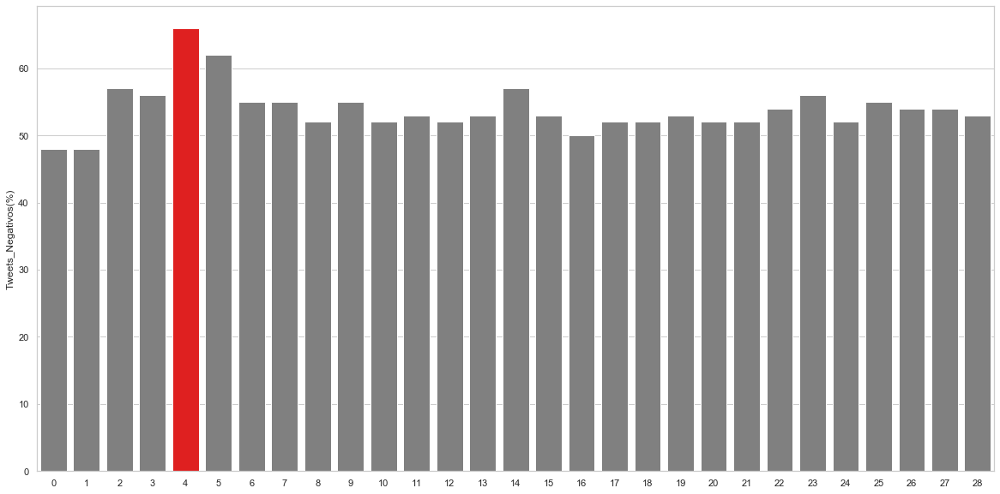

In [50]:
#Tweets Negativos:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB["Tweets_Negativos(%)"])) else 'red' for x in df_result_ACAB["Tweets_Negativos(%)"]]
sns.barplot(x=df_result_ACAB[0:29].index, y="Tweets_Negativos(%)", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

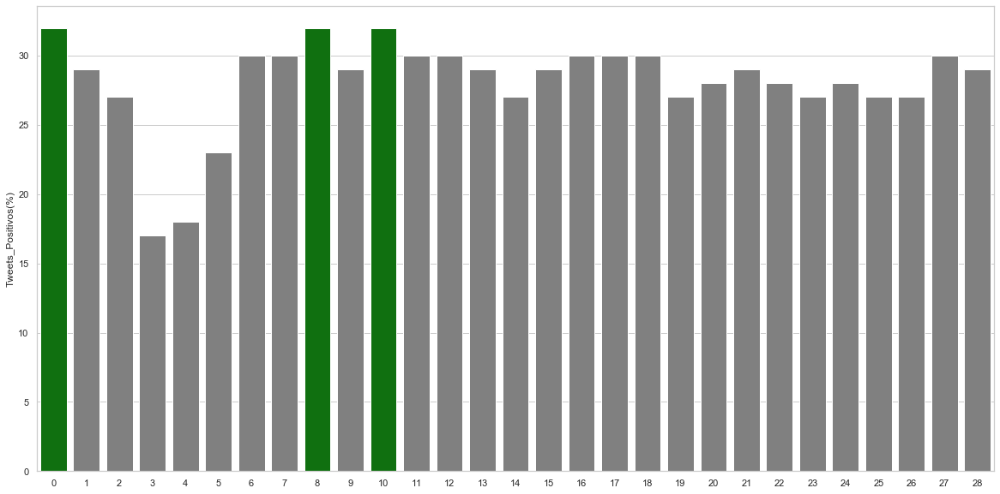

In [51]:
#Tweets Positivos:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB["Tweets_Positivos(%)"])) else 'green' for x in df_result_ACAB["Tweets_Positivos(%)"]]
sns.barplot(x=df_result_ACAB[0:29].index, y="Tweets_Positivos(%)", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

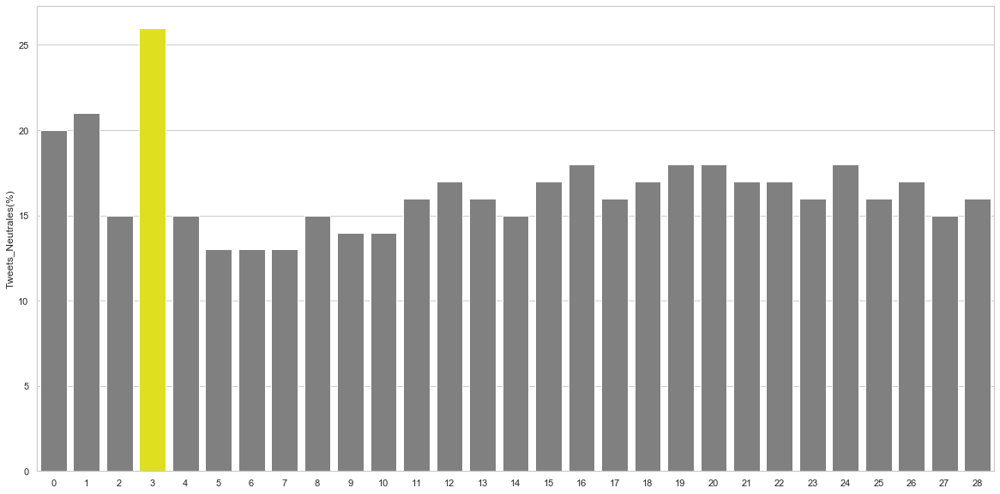

In [52]:
#Tweets Neutros:
plt.figure(figsize=(20,10))
sns.set(style="whitegrid")
clrs = ['grey' if (x < max(df_result_ACAB["Tweets_Neutrales(%)"])) else 'yellow' for x in df_result_ACAB["Tweets_Neutrales(%)"]]
sns.barplot(x=df_result_ACAB[0:29].index, y="Tweets_Neutrales(%)", data=df_result_ACAB[0:29], palette=clrs)
plt.show()

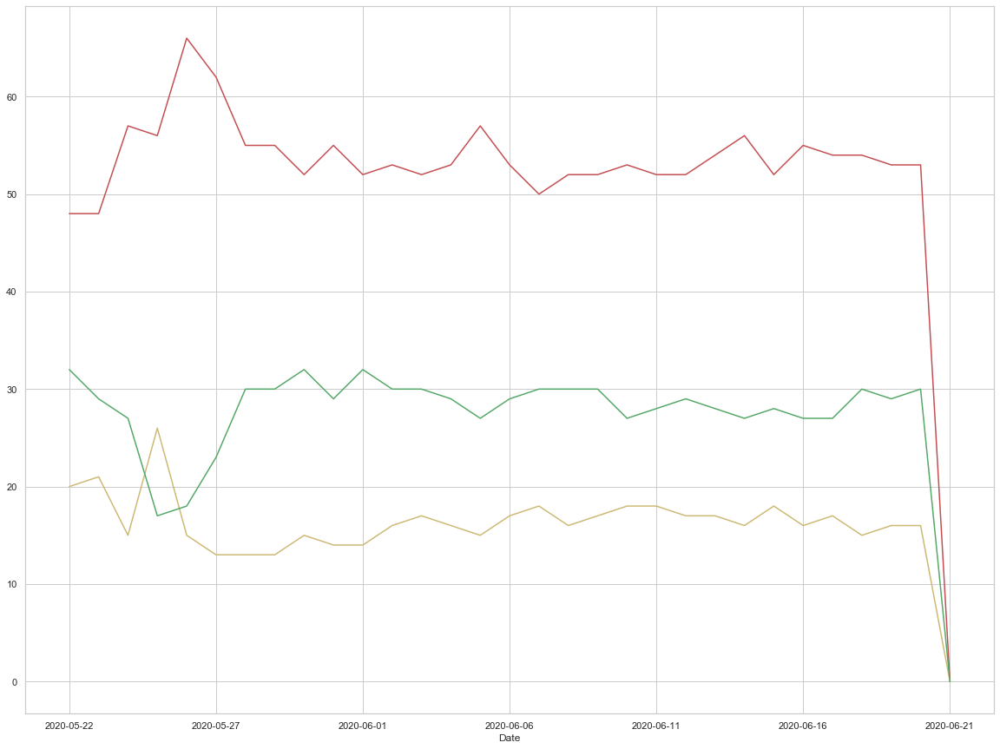

In [53]:
#Graficamos la información de polarización (neutro, positivo, negativo) en el tiempo:
#Tweets Negativos:
time_favorites_date = pd.Series(data=np.array(df_result_ACAB["Tweets_Negativos(%)"]), index=df_result_ACAB["Date"])
time_favorites_date.plot(figsize=(20,15), label = "Negativos", color="r")
#Tweets Neutros:
time_retweets_date = pd.Series(data=np.array(df_result_ACAB["Tweets_Neutrales(%)"]), index=df_result_ACAB["Date"])
time_retweets_date.plot(figsize=(20,15), label = "Neutrales", color="y")
#Tweets Positivos:
n_tweets_date = pd.Series(data=np.array(df_result_ACAB["Tweets_Positivos(%)"]), index=df_result_ACAB["Date"])
n_tweets_date.plot(figsize=(20,15), label = "Positivos", color="g")
plt.show()

3. La siguiente gráfica de acumulación para los tweets Positivos, Negativos y Neutros se construye en base a la misma información que la anterior. Se puede observar que a diferencia de la gráfica de #BlackLivesMatter, los tweets negativos continúan incrementando por sobre los positivos. Esto nos puede dar una idea de cómo este hashtag es utilizado para realizar comentarios no constructivos en su mayoría de casos y no presenta comentarios positivos ni de esperanza en fechas de celebración o conmemoración.

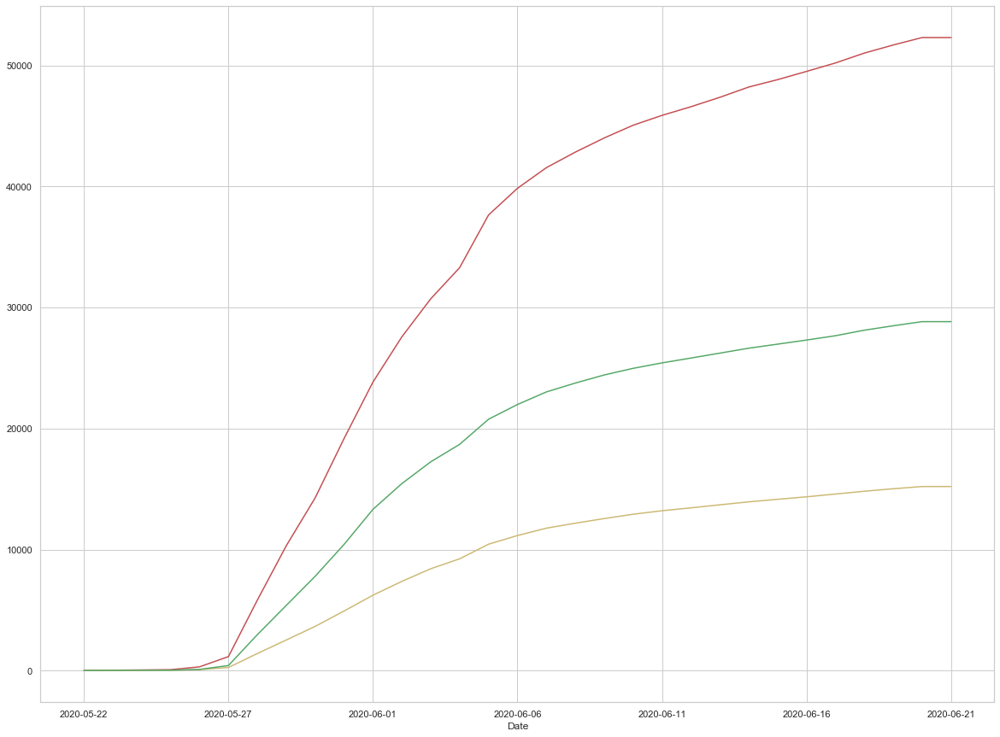

In [54]:
#Graficamos la información de polarización (neutro, positivo, negativo) en el tiempo:
sum_neg, sum_neu, sum_pos = 0, 0, 0
neg, neu, pos = [], [], []
for i in range(len(dates)):
    sum_neg = sum_neg +  df_result_ACAB.Tweets_Negativos[i]
    sum_neu = sum_neu +  df_result_ACAB.Tweets_Neutrales[i]
    sum_pos = sum_pos +  df_result_ACAB.Tweets_Positivos[i]
    neg.append(sum_neg)
    neu.append(sum_neu)
    pos.append(sum_pos)
    
#Tweets Negativos:
time_favorites_date = pd.Series(data=np.array(neg), index=df_result_ACAB["Date"])
time_favorites_date.plot(figsize=(20,15), label = "Negativos", color="r")
#Tweets Neutros:
time_retweets_date = pd.Series(data=np.array(neu), index=df_result_ACAB["Date"])
time_retweets_date.plot(figsize=(20,15), label = "Neutrales", color="y")
#Tweets Positivos:
n_tweets_date = pd.Series(data=np.array(pos), index=df_result_ACAB["Date"])
n_tweets_date.plot(figsize=(20,15), label = "Positivos", color="g")
plt.show()

Se analiza el porcentaje de tweets positivos, negativos y neutros asociados a los hashtags más relevantes por cada uno de los días evaluados. En la presentación (PPT) se pueden visualizar los resultados de mejor manera.

In [151]:
#Analizamos el porcentaje de Positivismo, Neutralidad y Negativismo por Hashtag durante cada día.
user_neu, user_pos, user_neg = [], [], []
most_positive, most_negative, most_neutral = 0, 0, 0
hashtag_positivo, hashtag_negative, hashtag_neutral = 0, 0, 0
for i in range(0,len(dates)):
    date = dates[i]
    sentiment_analysis_dict = {}
    freq_hashtags = df_result_ACAB.Frequent_Hashtags[i]
    for k in range(len(freq_hashtags)):
        positive, neutral, negative = 0, 0, 0       
        for j in range(len(df_filter_trial_new_ACAB['User'])):
            date_twitter = df_filter_trial_new_ACAB['Date'][j]
            date_twitter = date_twitter[:10].strip()            
            if date_twitter == date:
                tweet_hashtags = set(df_filter_trial_new_ACAB.Hashtags[j].split()) 
                tweet_hashtags = (list(tweet_hashtags))
                if (freq_hashtags[k] in tweet_hashtags):
                    if (df_filter_trial_new_ACAB["Polarity"][j] == "Negative"):
                        negative = negative + 1
                        user_neg.append(df_filter_trial_new_ACAB["User"][j])
                    elif (df_filter_trial_new_ACAB["Polarity"][j] == "Neutral"):
                        neutral = neutral + 1
                        user_neu.append(df_filter_trial_new_ACAB["User"][j])
                    elif (df_filter_trial_new_ACAB["Polarity"][j] == "Positive"):
                        positive = positive + 1
                        user_pos.append(df_filter_trial_new_ACAB["User"][j])
        
        if (positive > most_positive):
            most_positive = positive
            hashtag_positivo = freq_hashtags[k]
        if (neutral > most_neutral):
            most_neutral = neutral
            hashtag_neutral = freq_hashtags[k]
        if (negative > most_negative):
            most_negative = negative
            hashtag_negative = freq_hashtags[k]
    
        total = positive + negative + neutral
        print("Día:", i+1)
        print("Fecha:", date)
        print("Hashtag:",freq_hashtags[k])
        print("Positivo",int(100*(positive/total)))
        print("Negativo",int(100*(negative/total)))
        print("Neutral",int(100*(neutral/total)))
        print("-----------")
    
print("Hashtag más Positivo",hashtag_positivo)
print("Hashtag más Negativo",hashtag_negative)
print("Hashtag más Neutral",hashtag_neutral)
    

Día: 1
Fecha: 2020-05-22
Hashtag: #ACAB
Positivo 33
Negativo 46
Neutral 20
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #acab
Positivo 27
Negativo 54
Neutral 18
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #FTP
Positivo 0
Negativo 66
Neutral 33
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #coronavirus
Positivo 0
Negativo 100
Neutral 0
-----------
Día: 1
Fecha: 2020-05-22
Hashtag: #ftp
Positivo 0
Negativo 100
Neutral 0
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #ACAB
Positivo 24
Negativo 51
Neutral 24
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #acab
Positivo 50
Negativo 37
Neutral 12
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #FTP
Positivo 66
Negativo 33
Neutral 0
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #ftp
Positivo 33
Negativo 66
Neutral 0
-----------
Día: 2
Fecha: 2020-05-23
Hashtag: #BlackLivesMatter
Positivo 0
Negativo 50
Neutral 50
-----------
Día: 3
Fecha: 2020-05-24
Hashtag: #ACAB
Positivo 28
Negativo 60
Neutral 12
-----------
Día: 3
Fecha: 2020-05-24
Hashtag: 

# 5. Análisis de Tópicos:  #ACAB

Se utilizó el algoritmo de aprendizaje no supervisado **LDA (Latent Dirichlet Allocation)** para realizar el análisis de los tópicos más relevantes durante los días evaluados. Después de varias pruebas variando los hiperparámetros (alpha, betha, número de tópicos y número de iteraciones con los datos) y comparando Bag of Words (BOW) y TFIDF para generar el "corpus", se obtuvieron los siguientes resultados.

In [55]:
#Utilizamos TFIDF para crear el corpus:
tweets_dict = corpora.Dictionary(df_filter_trial_ACAB['Tokens'])

bow_corpus = [tweets_dict.doc2bow(token_tweet) for token_tweet in df_filter_trial_ACAB['Tokens']]

tfidf = models.TfidfModel(bow_corpus)
tfidf_corpus = tfidf[bow_corpus]

NUM_TOPICS = 20
NUM_PASSES = 15 
ALPHA = 0.1
ETA = 'auto'

ldamodel = models.ldamodel.LdaModel(tfidf_corpus, 
                                    num_topics = NUM_TOPICS, 
                                    id2word=tweets_dict, 
                                    passes=NUM_PASSES,
                                    alpha=ALPHA, 
                                    eta=ETA,
                                    random_state=49)

topics = ldamodel.print_topics(num_words=4)

for topic in topics:
    print(topic)

(0, '0.036*"justice" + 0.034*"read" + 0.033*"sign" + 0.025*"via"')
(1, '0.015*"reminder" + 0.014*"wait" + 0.012*"flag" + 0.011*"world"')
(2, '0.014*"thank" + 0.014*"wonder" + 0.012*"blm" + 0.010*"movement"')
(3, '0.013*"wan" + 0.012*"na" + 0.010*"cop" + 0.010*"big"')
(4, '0.050*"thread" + 0.036*"gon" + 0.035*"na" + 0.021*"pretty"')
(5, '0.013*"cop" + 0.011*"murderer" + 0.010*"girl" + 0.009*"talking"')
(6, '0.021*"disgusting" + 0.019*"absolutely" + 0.018*"portland" + 0.016*"seriously"')
(7, '0.023*"defund" + 0.014*"please" + 0.010*"police" + 0.010*"happy"')
(8, '0.019*"former" + 0.018*"lol" + 0.014*"great" + 0.014*"hey"')
(9, '0.040*"check" + 0.035*"fuck" + 0.030*"video" + 0.019*"forget"')
(10, '0.032*"bad" + 0.026*"good" + 0.026*"cop" + 0.021*"apple"')
(11, '0.014*"tear" + 0.014*"police" + 0.014*"shoot" + 0.012*"union"')
(12, '0.018*"law" + 0.017*"week" + 0.016*"assault" + 0.014*"enforcement"')
(13, '0.017*"arrest" + 0.017*"cop" + 0.016*"protect" + 0.015*"people"')
(14, '0.025*"quit" +

In [56]:
lda_display = pyLDAvis.gensim.prepare(ldamodel, tfidf_corpus, tweets_dict, sort_topics=False)
pyLDAvis.display(lda_display)

In [57]:
#Utilizamos BOW para crear el corpus:
tweets_dict = corpora.Dictionary(df_filter_trial_ACAB['Tokens'])

NUM_TOPICS = 20
NUM_PASSES = 15 
ALPHA = 0.1
ETA = 'auto'

bow_corpus = [tweets_dict.doc2bow(token_tweet) for token_tweet in df_filter_trial_ACAB['Tokens']]

ldamodel = models.ldamodel.LdaModel(bow_corpus, 
                                    num_topics = NUM_TOPICS, 
                                    id2word=tweets_dict, 
                                    passes=NUM_PASSES,
                                    alpha=ALPHA, 
                                    eta=ETA,
                                    random_state=49)

topics = ldamodel.print_topics(num_words=4)

for topic in topics:
    print(topic)

(0, '0.057*"arrest" + 0.048*"murder" + 0.046*"sign" + 0.036*"death"')
(1, '0.165*"life" + 0.108*"black" + 0.089*"matter" + 0.047*"blue"')
(2, '0.051*"please" + 0.034*"last" + 0.032*"watch" + 0.027*"love"')
(3, '0.066*"know" + 0.053*"want" + 0.045*"think" + 0.043*"people"')
(4, '0.145*"need" + 0.052*"na" + 0.044*"change" + 0.033*"gon"')
(5, '0.277*"police" + 0.051*"officer" + 0.023*"brutality" + 0.018*"violence"')
(6, '0.104*"protest" + 0.044*"shot" + 0.041*"peaceful" + 0.031*"tear"')
(7, '0.077*"video" + 0.063*"keep" + 0.037*"defund" + 0.034*"check"')
(8, '0.045*"guy" + 0.037*"well" + 0.033*"friend" + 0.029*"care"')
(9, '0.058*"really" + 0.044*"said" + 0.035*"hate" + 0.032*"something"')
(10, '0.339*"cop" + 0.075*"good" + 0.058*"bad" + 0.040*"one"')
(11, '0.162*"people" + 0.061*"black" + 0.059*"white" + 0.041*"man"')
(12, '0.063*"right" + 0.050*"see" + 0.046*"never" + 0.033*"stand"')
(13, '0.090*"fucking" + 0.085*"shit" + 0.037*"amp" + 0.027*"stop"')
(14, '0.063*"job" + 0.047*"law" + 0.

In [58]:
lda_display = pyLDAvis.gensim.prepare(ldamodel, tfidf_corpus, tweets_dict, sort_topics=False)
pyLDAvis.display(lda_display)

# 6. Propuesta de Aplicación

Se base al análisis de los tweets asociados a cada uno de los hashtags (#BlackLivesMatter y #ACAB) a lo largo de 30 días, podemos concluir que el movimiento #BlackLivesMatter en redes sociales involucra muchos aspectos. Desde protestas contra la violencia hacia el ciudadano de color, solicitudes de firmas, recaudación de fondos, celebraciones de días especiales o conmemorativos, recuerdos de violencia hacia miembros de la comunidad afroamericana, entre otros. Es por ello, que los sentimientos asociados a este hashtag no son todos enteramente negativos (a pesar de ser un símbolo concebido en signo de protesta) y en un punto llegan a ser más positivos gracias a las celebraciones y mensajes de esperanza que los miembros envían.
Por otro lado, como supusimos en un inicio, el hashtag #ACAB es utiliza en su mayoría para emitir comentarios negativos, violentos y no constructivos alrededor del mensaje que el movimiento "Black Lives Matter" quiere transmitir. Este tipo de actitudes pueden ser muy nocivas e incluso termina por socavar en medio del caos y violencia (que hemos visto en centros comerciales y calles de Estados Unidos) los esfuerzos de cambio del movimiento "Black Live Matters". 

En ese sentido, lo que se plantea es poder detectar comentarios no constructivos o violentos que no sumen al esfuerzo del movimiento BLM y así poder tomar medidas para desvincular del grupo a ese usuario o miembro que podría generar problemas. Para ello, se propone utilizar el dataset de #ACAB y #BlackLiveMatters para entrenar un algoritmo de ML que pueda clasificar como "Constructivo" o "No Constructivo" al texto de un tweet. Tomando como referencia los comentarios de #ACAB como "No Constructivos" y los de #BlackLiveMatters como "Constructivos".

In [211]:
def array_to_text (tokens):
    return ' '.join(tokens)

In [226]:
df_features = pd.concat([df_filter_trial_new_ACAB[0:5000], df_filter_trial_new[0:5000]])
df_features.index = range(len(df_features.User))
df_labels = np.zeros(10000)
df_labels[0:5000] = 1
df_features["Features"] = df_features['Tokens_Stem'].apply(array_to_text)

In [227]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_features, df_labels, test_size=0.33, random_state=42)

In [228]:
df_features.head()

,ID,User,Text_Original,Text_Original_Size,Date,Favorites,Retweets,Mentions,Hashtags,Clean_Data,Clean_Data_Size,Tokens,Tokens_Stem,Compound,Positive,Negative,Neutral,Polarity,Features
0,1263981439902609408,mustachetoilet,Yeah I'm not saying it's right and I think you...,118,2020-05-22 23:53:53+00:00,3,0,,#ACAB,Yeah not saying right and think you done good ...,85,"[yeah, saying, right, think, done, good, job, ...","[yeah, say, right, think, done, good, job, poi...",0.2960,0.255,0.145,0.600,Positive,yeah say right think done good job point probl...
1,1263972698243256320,Rzhevsky,it’s as good as any. but just as likely they’r...,144,2020-05-22 23:19:09+00:00,1,0,,#ACAB,good any but just likely they putting Demmings...,115,"[good, likely, putting, demmings, give, cover,...","[good, like, put, dem, give, cover, would, fee...",0.1280,0.091,0.068,0.841,Positive,good like put dem give cover would feel sorri
2,1263972680329502721,thomaswikjr2,he really did miss that spike stripe. #Hero #...,51,2020-05-22 23:19:05+00:00,0,0,,#Hero #ACAB,really did miss that spike stripe,33,"[really, miss, spike, stripe]","[realli, miss, spike, stripe]",-0.2212,0.000,0.273,0.727,Negative,realli miss spike stripe
3,1263969502796136451,Anarconomist,If she was black she would have been shot 18 t...,58,2020-05-22 23:06:27+00:00,0,0,,#ACAB,she was black she would have been shot times,44,"[black, would, shot, time]","[black, would, shot, time]",0.0000,0.000,0.000,1.000,Neutral,black would shot time
4,1263956235067568129,holladiejan,Those are not cops but community service offic...,84,2020-05-22 22:13:44+00:00,11,0,,#acab,Those are not cops but community service offic...,77,"[cop, community, service, officer, cheer, neth...","[cop, communiti, servic, offic, cheer, netherl...",0.6310,0.274,0.000,0.726,Positive,cop communiti servic offic cheer netherland


In [229]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=3)
tfidf = vectorizer.fit(df_features["Features"].tolist())

train_tfidf = tfidf.transform(X_train["Features"].tolist())
test_tfidf = tfidf.transform(X_test["Features"].tolist())

train_tfidf.shape, test_tfidf.shape

((1340, 1260), (660, 1260))

In [230]:
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.svm import SVC

def binary_model_SVC(train, test, y_train, y_test):
    rf = SVC(gamma='auto')
    rf.fit(train,y_train)

    predictions = rf.predict(test)
    print("Accuracy Score -> ",accuracy_score(predictions, y_test)*100)
    print("F1 Score -> ",f1_score(predictions, y_test)*100)

    return rf

In [231]:
def f2int (label):
    return int(label)
X_train = pd.DataFrame(train_tfidf.toarray(), columns=tfidf.get_feature_names())
X_test = pd.DataFrame(test_tfidf.toarray(), columns=tfidf.get_feature_names())
Y_train = pd.Series(y_train).apply(f2int)
Y_test = pd.Series(y_test).apply(f2int)

In [232]:
rf = binary_model_SVC(X_train, X_test, y_train, y_test)

Accuracy Score ->  49.24242424242424
F1 Score ->  65.98984771573603


El principal problema que veo es que el vocabulario entre ambos hashtags es similar y los tópicos que tocan no son tan diferentes entre ellos. Por ello, y en base a lo que hemos visto en cuanto a cómo evoluciona la polaridad para ambos hashtags en el tiempo (#BlackLivesMatter oscila entre positivo y negativo, mientras que #ACAB se mantiene en comentarios negativos). Otra forma de clasificarlos puede ser en base a cómo evolucionan sus sentimientos a lo largo del tiempo. Si el grupo X mantiene comentarios negativos durante un tiempo N se podría asociar a ser un tipo de comentario nocivo o "no constructivo". Caso contrario, si el grupo Y mantiene comentarios que varían entre positivos y negativos a lo largo de tiempo, se puede asociar a ser "constructivo" (o por lo menos más complejo).